### 1. Load History OHCLV 

Download-data: 
`
freqtrade download-data --config user_data/config.json --timeframe 15m --timerange 20240101-20250101
`

File-like:
`
BTC_USDT-15m.feather
`


In [1]:
import pandas as pd 
import os
import re
import warnings
warnings.filterwarnings("ignore")
import sys
sys.path.append('./')

file_path = '/usr/local/services/freqtrade-grid/user_data/data/binance/futures'
time_frame = '1d'

def extract_coin_symbols(directory):
    coin_list = []
    pattern = re.compile(r'(.+?)_USDT-1d-futures\.feather$')

    for filename in os.listdir(directory):
        match = pattern.match(filename)
        if match:
            coin_symbol = (match.group(1)+':USDT').replace('_','/')
            coin_list.append(coin_symbol)
    
    return coin_list


if os.path.exists(file_path) and os.path.isdir(file_path):
    coins = extract_coin_symbols(file_path)
print(len(coins))

393


### 2. Pair Filter

In [2]:
top50 = [
"BTC/USDT:USDT","ETH/USDT:USDT","XRP/USDT:USDT","BNB/USDT:USDT","SOL/USDT:USDT","DOGE/USDT:USDT","TRX/USDT:USDT","ADA/USDT:USDT","SUI/USDT:USDT","HYPE/USDT:USDT","LINK/USDT:USDT","AVAX/USDT:USDT","XLM/USDT:USDT","TON/USDT:USDT","BCH/USDT:USDT","HBAR/USDT:USDT","LTC/USDT:USDT","DOT/USDT:USDT","XMR/USDT:USDT","UNI/USDT:USDT","AAVE/USDT:USDT","TAO/USDT:USDT","NEAR/USDT:USDT","APT/USDT:USDT","ONDO/USDT:USDT","ICP/USDT:USDT","ETC/USDT:USDT","KAS/USDT:USDT","POL/USDT:USDT","TRUMP/USDT:USDT","VET/USDT:USDT","RENDER/USDT:USDT","ENA/USDT:USDT","FET/USDT:USDT","WLD/USDT:USDT","ARB/USDT:USDT","FIL/USDT:USDT"
]

top100 = [
"BTC/USDT:USDT","ETH/USDT:USDT","XRP/USDT:USDT","BNB/USDT:USDT","SOL/USDT:USDT","DOGE/USDT:USDT","TRX/USDT:USDT","ADA/USDT:USDT","SUI/USDT:USDT","HYPE/USDT:USDT","LINK/USDT:USDT","AVAX/USDT:USDT","XLM/USDT:USDT","TON/USDT:USDT","BCH/USDT:USDT","HBAR/USDT:USDT","LTC/USDT:USDT","DOT/USDT:USDT","XMR/USDT:USDT","UNI/USDT:USDT","AAVE/USDT:USDT","TAO/USDT:USDT","NEAR/USDT:USDT","APT/USDT:USDT","ONDO/USDT:USDT","ICP/USDT:USDT","ETC/USDT:USDT","KAS/USDT:USDT","POL/USDT:USDT","TRUMP/USDT:USDT","VET/USDT:USDT","RENDER/USDT:USDT","ENA/USDT:USDT","FET/USDT:USDT","WLD/USDT:USDT","ARB/USDT:USDT","FIL/USDT:USDT","ATOM/USDT:USDT","ALGO/USDT:USDT","JUP/USDT:USDT","TIA/USDT:USDT","VIRTUAL/USDT:USDT","INJ/USDT:USDT","QNT/USDT:USDT","STX/USDT:USDT","S/USDT:USDT","DEXE/USDT:USDT","OP/USDT:USDT","FARTCOIN/USDT:USDT","IP/USDT:USDT","FORM/USDT:USDT","SEI/USDT:USDT","A/USDT:USDT","SPX/USDT:USDT","IMX/USDT:USDT","WIF/USDT:USDT","GRT/USDT:USDT","CRV/USDT:USDT","LDO/USDT:USDT","ZEC/USDT:USDT","ENS/USDT:USDT","JASMY/USDT:USDT","THETA/USDT:USDT","CAKE/USDT:USDT","GALA/USDT:USDT","WAL/USDT:USDT","SAND/USDT:USDT","IOTA/USDT:USDT","PYTH/USDT:USDT","PENGU/USDT:USDT","BSV/USDT:USDT","PENDLE/USDT:USDT","KAIA/USDT:USDT"
]

top150 = [
"BTC/USDT:USDT","ETH/USDT:USDT","XRP/USDT:USDT","BNB/USDT:USDT","SOL/USDT:USDT","DOGE/USDT:USDT","TRX/USDT:USDT","ADA/USDT:USDT","SUI/USDT:USDT","HYPE/USDT:USDT","LINK/USDT:USDT","AVAX/USDT:USDT","XLM/USDT:USDT","TON/USDT:USDT","BCH/USDT:USDT","HBAR/USDT:USDT","LTC/USDT:USDT","DOT/USDT:USDT","XMR/USDT:USDT","UNI/USDT:USDT","AAVE/USDT:USDT","TAO/USDT:USDT","NEAR/USDT:USDT","APT/USDT:USDT","ONDO/USDT:USDT","ICP/USDT:USDT","ETC/USDT:USDT","KAS/USDT:USDT","POL/USDT:USDT","TRUMP/USDT:USDT","VET/USDT:USDT","RENDER/USDT:USDT","ENA/USDT:USDT","FET/USDT:USDT","WLD/USDT:USDT","ARB/USDT:USDT","FIL/USDT:USDT","ATOM/USDT:USDT","ALGO/USDT:USDT","JUP/USDT:USDT","TIA/USDT:USDT","VIRTUAL/USDT:USDT","INJ/USDT:USDT","QNT/USDT:USDT","STX/USDT:USDT","S/USDT:USDT","DEXE/USDT:USDT","OP/USDT:USDT","FARTCOIN/USDT:USDT","IP/USDT:USDT","FORM/USDT:USDT","SEI/USDT:USDT","A/USDT:USDT","SPX/USDT:USDT","IMX/USDT:USDT","WIF/USDT:USDT","GRT/USDT:USDT","CRV/USDT:USDT","LDO/USDT:USDT","ZEC/USDT:USDT","ENS/USDT:USDT","JASMY/USDT:USDT","THETA/USDT:USDT","CAKE/USDT:USDT","GALA/USDT:USDT","WAL/USDT:USDT","SAND/USDT:USDT","IOTA/USDT:USDT","PYTH/USDT:USDT","PENGU/USDT:USDT","BSV/USDT:USDT","PENDLE/USDT:USDT","KAIA/USDT:USDT","XTZ/USDT:USDT","RUNE/USDT:USDT","FLOW/USDT:USDT","BRETT/USDT:USDT","ZKJ/USDT:USDT","JTO/USDT:USDT","XCN/USDT:USDT","MANA/USDT:USDT","APE/USDT:USDT","KAITO/USDT:USDT","DEEP/USDT:USDT","ATH/USDT:USDT","GRASS/USDT:USDT","EIGEN/USDT:USDT","EGLD/USDT:USDT","DYDX/USDT:USDT","AR/USDT:USDT","AERO/USDT:USDT","STRK/USDT:USDT","KAVA/USDT:USDT","NEO/USDT:USDT","AXS/USDT:USDT","RSR/USDT:USDT","SUPER/USDT:USDT","LPT/USDT:USDT","ETHFI/USDT:USDT","W/USDT:USDT","CFX/USDT:USDT","SYRUP/USDT:USDT","CHZ/USDT:USDT","MOVE/USDT:USDT","POPCAT/USDT:USDT","MORPHO/USDT:USDT","COMP/USDT:USDT","SAFE/USDT:USDT","SUN/USDT:USDT"
]


top200 = [
"BTC/USDT:USDT","ETH/USDT:USDT","XRP/USDT:USDT","BNB/USDT:USDT","SOL/USDT:USDT","DOGE/USDT:USDT","TRX/USDT:USDT","ADA/USDT:USDT","SUI/USDT:USDT","HYPE/USDT:USDT","LINK/USDT:USDT","AVAX/USDT:USDT","XLM/USDT:USDT","TON/USDT:USDT","BCH/USDT:USDT","HBAR/USDT:USDT","LTC/USDT:USDT","DOT/USDT:USDT","XMR/USDT:USDT","UNI/USDT:USDT","AAVE/USDT:USDT","TAO/USDT:USDT","NEAR/USDT:USDT","APT/USDT:USDT","ONDO/USDT:USDT","ICP/USDT:USDT","ETC/USDT:USDT","KAS/USDT:USDT","POL/USDT:USDT","TRUMP/USDT:USDT","VET/USDT:USDT","RENDER/USDT:USDT","ENA/USDT:USDT","FET/USDT:USDT","WLD/USDT:USDT","ARB/USDT:USDT","FIL/USDT:USDT","ATOM/USDT:USDT","ALGO/USDT:USDT","JUP/USDT:USDT","TIA/USDT:USDT","VIRTUAL/USDT:USDT","INJ/USDT:USDT","QNT/USDT:USDT","STX/USDT:USDT","S/USDT:USDT","DEXE/USDT:USDT","OP/USDT:USDT","FARTCOIN/USDT:USDT","IP/USDT:USDT","FORM/USDT:USDT","SEI/USDT:USDT","A/USDT:USDT","SPX/USDT:USDT","IMX/USDT:USDT","WIF/USDT:USDT","GRT/USDT:USDT","CRV/USDT:USDT","LDO/USDT:USDT","ZEC/USDT:USDT","ENS/USDT:USDT","JASMY/USDT:USDT","THETA/USDT:USDT","CAKE/USDT:USDT","GALA/USDT:USDT","WAL/USDT:USDT","SAND/USDT:USDT","IOTA/USDT:USDT","PYTH/USDT:USDT","PENGU/USDT:USDT","BSV/USDT:USDT","PENDLE/USDT:USDT","KAIA/USDT:USDT","XTZ/USDT:USDT","RUNE/USDT:USDT","FLOW/USDT:USDT","BRETT/USDT:USDT","ZKJ/USDT:USDT","JTO/USDT:USDT","XCN/USDT:USDT","MANA/USDT:USDT","APE/USDT:USDT","KAITO/USDT:USDT","DEEP/USDT:USDT","ATH/USDT:USDT","GRASS/USDT:USDT","EIGEN/USDT:USDT","EGLD/USDT:USDT","DYDX/USDT:USDT","AR/USDT:USDT","AERO/USDT:USDT","STRK/USDT:USDT","KAVA/USDT:USDT","NEO/USDT:USDT","AXS/USDT:USDT","RSR/USDT:USDT","SUPER/USDT:USDT","LPT/USDT:USDT","ETHFI/USDT:USDT","W/USDT:USDT","CFX/USDT:USDT","SYRUP/USDT:USDT","CHZ/USDT:USDT","MOVE/USDT:USDT","POPCAT/USDT:USDT","MORPHO/USDT:USDT","COMP/USDT:USDT","SAFE/USDT:USDT","SUN/USDT:USDT","TWT/USDT:USDT","JST/USDT:USDT","AKT/USDT:USDT","OM/USDT:USDT","AXL/USDT:USDT","TURBO/USDT:USDT","BERA/USDT:USDT","1INCH/USDT:USDT","MEW/USDT:USDT","MINA/USDT:USDT","KSM/USDT:USDT","AI16Z/USDT:USDT","DASH/USDT:USDT","PNUT/USDT:USDT","ZRO/USDT:USDT","NXPC/USDT:USDT","SFP/USDT:USDT","NOT/USDT:USDT","SNX/USDT:USDT","GLM/USDT:USDT","ROSE/USDT:USDT","ZIL/USDT:USDT","MOCA/USDT:USDT","MASK/USDT:USDT","BLUR/USDT:USDT","QTUM/USDT:USDT","CKB/USDT:USDT","MOODENG/USDT:USDT","ASTR/USDT:USDT","ZK/USDT:USDT","ZRX/USDT:USDT","GAS/USDT:USDT","ORDI/USDT:USDT","BAT/USDT:USDT","VANA/USDT:USDT","ACH/USDT:USDT"
]

copy_all = [
"BTC/USDT:USDT","ETH/USDT:USDT","BNB/USDT:USDT","DOGE/USDT:USDT","SOL/USDT:USDT","XRP/USDT:USDT","1000PEPE/USDT:USDT","1000SHIB/USDT:USDT","AAVE/USDT:USDT","ADA/USDT:USDT","ARB/USDT:USDT","AVAX/USDT:USDT","ENA/USDT:USDT","ETC/USDT:USDT","FIL/USDT:USDT","LINK/USDT:USDT","LTC/USDT:USDT","NEAR/USDT:USDT","SEI/USDT:USDT","SUI/USDT:USDT","WLD/USDT:USDT","XLM/USDT:USDT","TRUMP/USDT:USDT","1000FLOKI/USDT:USDT","1000SATS/USDT:USDT","ACT/USDT:USDT","AERGO/USDT:USDT","APT/USDT:USDT","ATH/USDT:USDT","BABY/USDT:USDT","BANANAS31/USDT:USDT","BANANA/USDT:USDT","BANK/USDT:USDT","BCH/USDT:USDT","BROCCOLI714/USDT:USDT","BROCCOLIF3B/USDT:USDT","BR/USDT:USDT","BTCDOM/USDT:USDT","DEEP/USDT:USDT","DOT/USDT:USDT","EDU/USDT:USDT","EPT/USDT:USDT","FHE/USDT:USDT","FIS/USDT:USDT","FORM/USDT:USDT","FORTH/USDT:USDT","FUN/USDT:USDT","GRASS/USDT:USDT","GUN/USDT:USDT","HBAR/USDT:USDT","HIPPO/USDT:USDT","HMSTR/USDT:USDT","HYPER/USDT:USDT","ICP/USDT:USDT","INIT/USDT:USDT","IP/USDT:USDT","JELLYJELLY/USDT:USDT","JUP/USDT:USDT","KAITO/USDT:USDT","KERNEL/USDT:USDT","LDO/USDT:USDT","MAVIA/USDT:USDT","MEMEFI/USDT:USDT","MKR/USDT:USDT","MLN/USDT:USDT","NKN/USDT:USDT","OM/USDT:USDT","ONDO/USDT:USDT","ORDI/USDT:USDT","PARTI/USDT:USDT","PAXG/USDT:USDT","PERP/USDT:USDT","PLUME/USDT:USDT","PNUT/USDT:USDT","PROMPT/USDT:USDT","PUMP/USDT:USDT","RARE/USDT:USDT","REZ/USDT:USDT","RSR/USDT:USDT","SIREN/USDT:USDT","STO/USDT:USDT","TAO/USDT:USDT","TIA/USDT:USDT","TON/USDT:USDT","TRB/USDT:USDT","TRX/USDT:USDT","TUT/USDT:USDT","UNI/USDT:USDT","VOXEL/USDT:USDT","WAL/USDT:USDT","WCT/USDT:USDT","WIF/USDT:USDT","XCN/USDT:USDT","1000BONK/USDT:USDT","1000CHEEMS/USDT:USDT","1000RATS/USDT:USDT","ACH/USDT:USDT","AI16Z/USDT:USDT","ALCH/USDT:USDT","ALGO/USDT:USDT","APE/USDT:USDT","ARC/USDT:USDT","ARKM/USDT:USDT","AR/USDT:USDT","ATOM/USDT:USDT","AUCTION/USDT:USDT","AXS/USDT:USDT","BAN/USDT:USDT","BERA/USDT:USDT","BLUR/USDT:USDT","BOME/USDT:USDT","CAKE/USDT:USDT","CFX/USDT:USDT","CHZ/USDT:USDT","COW/USDT:USDT","CRV/USDT:USDT","DEXE/USDT:USDT","DOGS/USDT:USDT","DYDX/USDT:USDT","EIGEN/USDT:USDT","ENS/USDT:USDT","EOS/USDT:USDT","ETHFI/USDT:USDT","FARTCOIN/USDT:USDT","FET/USDT:USDT","GALA/USDT:USDT","GMT/USDT:USDT","GOAT/USDT:USDT","GRT/USDT:USDT","INJ/USDT:USDT","IO/USDT:USDT","JTO/USDT:USDT","KAVA/USDT:USDT","LAYER/USDT:USDT","MANA/USDT:USDT","MASK/USDT:USDT","MELANIA/USDT:USDT","ME/USDT:USDT","MOODENG/USDT:USDT","MOVE/USDT:USDT","NEIRO/USDT:USDT","NEIROETH/USDT:USDT","NOT/USDT:USDT","OP/USDT:USDT","PENDLE/USDT:USDT","PENGU/USDT:USDT","PEOPLE/USDT:USDT","POL/USDT:USDT","POPCAT/USDT:USDT","PYTH/USDT:USDT","RENDER/USDT:USDT","RUNE/USDT:USDT","SAND/USDT:USDT","SHELL/USDT:USDT","SOLV/USDT:USDT","STRK/USDT:USDT","STX/USDT:USDT","S/USDT:USDT","SWARMS/USDT:USDT","THE/USDT:USDT","TST/USDT:USDT","TURBO/USDT:USDT","USDC/USDT:USDT","USUAL/USDT:USDT","VANA/USDT:USDT","VET/USDT:USDT","VIRTUAL/USDT:USDT","W/USDT:USDT","ZK/USDT:USDT","ZRO/USDT:USDT","1000000MOG/USDT:USDT","1000CAT/USDT:USDT","1000LUNC/USDT:USDT","1INCH/USDT:USDT","1MBABYDOGE/USDT:USDT","AEVO/USDT:USDT","AGLD/USDT:USDT","AIXBT/USDT:USDT","ALICE/USDT:USDT","ANIME/USDT:USDT","ANKR/USDT:USDT","ARK/USDT:USDT","AXL/USDT:USDT","BAKE/USDT:USDT","BAT/USDT:USDT","BB/USDT:USDT","BEAMX/USDT:USDT","BEL/USDT:USDT","BIGTIME/USDT:USDT","BIO/USDT:USDT","BMT/USDT:USDT","BSV/USDT:USDT","C98/USDT:USDT","CATI/USDT:USDT","CHILLGUY/USDT:USDT","COMP/USDT:USDT","COTI/USDT:USDT","CTSI/USDT:USDT","DASH/USDT:USDT","DENT/USDT:USDT","DF/USDT:USDT","DYM/USDT:USDT","EGLD/USDT:USDT","EPIC/USDT:USDT","FLM/USDT:USDT","FLOW/USDT:USDT","GAS/USDT:USDT","GLM/USDT:USDT","GPS/USDT:USDT","GRIFFAIN/USDT:USDT","GTC/USDT:USDT","HIFI/USDT:USDT","ID/USDT:USDT","IMX/USDT:USDT","IOTA/USDT:USDT","JASMY/USDT:USDT","KAS/USDT:USDT","KOMA/USDT:USDT","KSM/USDT:USDT","LISTA/USDT:USDT","LPT/USDT:USDT","LQTY/USDT:USDT","LUNA2/USDT:USDT","MANTA/USDT:USDT","MEME/USDT:USDT","METIS/USDT:USDT","MEW/USDT:USDT","MINA/USDT:USDT","MOCA/USDT:USDT","MORPHO/USDT:USDT","MUBARAK/USDT:USDT","NEO/USDT:USDT","ONE/USDT:USDT","POLYX/USDT:USDT","QNT/USDT:USDT","QUICK/USDT:USDT","RAYSOL/USDT:USDT","RED/USDT:USDT","ROSE/USDT:USDT","SAFE/USDT:USDT","SAGA/USDT:USDT","SCR/USDT:USDT","SFP/USDT:USDT","SNX/USDT:USDT","SPELL/USDT:USDT","SSV/USDT:USDT","STORJ/USDT:USDT","SUSHI/USDT:USDT","THETA/USDT:USDT","TNSR/USDT:USDT","TWT/USDT:USDT","UXLINK/USDT:USDT","VIC/USDT:USDT","VINE/USDT:USDT","VVV/USDT:USDT","XMR/USDT:USDT","XTZ/USDT:USDT","XVS/USDT:USDT","YFI/USDT:USDT","YGG/USDT:USDT","ZEC/USDT:USDT","ZEN/USDT:USDT","ZEREBRO/USDT:USDT","ZETA/USDT:USDT","ZIL/USDT:USDT","ZRX/USDT:USDT","1000WHY/USDT:USDT","1000XEC/USDT:USDT","1000X/USDT:USDT","ACE/USDT:USDT","ACX/USDT:USDT","AERO/USDT:USDT","AI/USDT:USDT","AKT/USDT:USDT","ALPACA/USDT:USDT","ALPHA/USDT:USDT","ALT/USDT:USDT","API3/USDT:USDT","ARPA/USDT:USDT","ASTR/USDT:USDT","ATA/USDT:USDT","AVAAI/USDT:USDT","AVA/USDT:USDT","B3/USDT:USDT","BAND/USDT:USDT","BICO/USDT:USDT","BID/USDT:USDT","BNT/USDT:USDT","BRETT/USDT:USDT","BSW/USDT:USDT","CELO/USDT:USDT","CELR/USDT:USDT","CETUS/USDT:USDT","CGPT/USDT:USDT","CHESS/USDT:USDT","CHR/USDT:USDT","CKB/USDT:USDT","COOKIE/USDT:USDT","COS/USDT:USDT","CYBER/USDT:USDT","DEFI/USDT:USDT","DEGEN/USDT:USDT","DEGO/USDT:USDT","DIA/USDT:USDT","DODOX/USDT:USDT","DRIFT/USDT:USDT","D/USDT:USDT","DUSK/USDT:USDT","ENJ/USDT:USDT","ETHW/USDT:USDT","FIDA/USDT:USDT","FIO/USDT:USDT","FLUX/USDT:USDT","FXS/USDT:USDT","GHST/USDT:USDT","GMX/USDT:USDT","G/USDT:USDT","HEI/USDT:USDT","HFT/USDT:USDT","HIGH/USDT:USDT","HIVE/USDT:USDT","HOOK/USDT:USDT","HOT/USDT:USDT","ICX/USDT:USDT","ILV/USDT:USDT","IOST/USDT:USDT","IOTX/USDT:USDT","JOE/USDT:USDT","KAIA/USDT:USDT","KDA/USDT:USDT","KMNO/USDT:USDT","KNC/USDT:USDT","LEVER/USDT:USDT","LOKA/USDT:USDT","LRC/USDT:USDT","LSK/USDT:USDT","LUMIA/USDT:USDT","MAGIC/USDT:USDT","MAV/USDT:USDT","MBOX/USDT:USDT","MOVR/USDT:USDT","MTL/USDT:USDT","MYRO/USDT:USDT","NFP/USDT:USDT","NMR/USDT:USDT","NTRN/USDT:USDT","OGN/USDT:USDT","OMNI/USDT:USDT","ONG/USDT:USDT","ONT/USDT:USDT","ORCA/USDT:USDT","OXT/USDT:USDT","PHA/USDT:USDT","PHB/USDT:USDT","PIPPIN/USDT:USDT","PIXEL/USDT:USDT","PONKE/USDT:USDT","PROM/USDT:USDT","PORTAL/USDT:USDT","POWR/USDT:USDT","QTUM/USDT:USDT","RDNT/USDT:USDT","REI/USDT:USDT","RIF/USDT:USDT","RLC/USDT:USDT","RONIN/USDT:USDT","RPL/USDT:USDT","RVN/USDT:USDT","SANTOS/USDT:USDT","SCRT/USDT:USDT","SKL/USDT:USDT","SLERF/USDT:USDT","SONIC/USDT:USDT","SPX/USDT:USDT","STEEM/USDT:USDT","STG/USDT:USDT","SUN/USDT:USDT","SUPER/USDT:USDT","SWELL/USDT:USDT","SXP/USDT:USDT","SYN/USDT:USDT","SYS/USDT:USDT","TLM/USDT:USDT","TOKEN/USDT:USDT","TRU/USDT:USDT","T/USDT:USDT","UMA/USDT:USDT","USTC/USDT:USDT","VANRY/USDT:USDT","VELODROME/USDT:USDT","VTHO/USDT:USDT","WAXP/USDT:USDT","WOO/USDT:USDT","XAI/USDT:USDT","XVG/USDT:USDT"
]


import random
random200 = random.sample(coins, 200)

target_coins = top200

print(len(target_coins))

145


### 3. Load History OHLCV 

In [3]:
def extract_coin_data(directory):
    coin_list = {}
    symbols = []
    pattern = re.compile(r'(.+?)_USDT-1d-futures\.feather$')

    for filename in os.listdir(directory):
        match = pattern.match(filename)
        if match:
            coin_symbol = (match.group(1)+':USDT').replace('_','/')
            if coin_symbol in target_coins: 
                df = pd.read_feather(f'{directory}/{filename}')
                df = df.reset_index(drop=True)
                if len(df) > 0 :
                    coin_list[coin_symbol] = df
                    symbols.append(coin_symbol)
    
    return coin_list,symbols

if os.path.exists(file_path) and os.path.isdir(file_path):
    coins,symbols = extract_coin_data(file_path)
print(len(coins))

139


### 3. History Data Transform

In [4]:
import pandas as pd
close_dfs = []
open_dfs = []
high_dfs = []
low_dfs = []
volume_dfs = []


for symbol, df in coins.items():
    
    temp_df = df[['date', 'close']].copy()
    temp_df['date'] = pd.to_datetime(temp_df['date'])
    temp_df = temp_df.set_index('date')  # 将date设为索引
    # temp_df.index = temp_df.index.tz_localize(None)
    temp_df.columns = [symbol]  
    close_dfs.append(temp_df)



    temp_df = df[['date', 'open']].copy()
    temp_df['date'] = pd.to_datetime(temp_df['date'])
    temp_df = temp_df.set_index('date')  # 将date设为索引
    # temp_df.index = temp_df.index.tz_localize(None)
    temp_df.columns = [symbol]  
    open_dfs.append(temp_df)


    temp_df = df[['date', 'high']].copy()
    temp_df['date'] = pd.to_datetime(temp_df['date'])
    temp_df = temp_df.set_index('date')  # 将date设为索引
    # temp_df.index = temp_df.index.tz_localize(None)
    temp_df.columns = [symbol]  
    high_dfs.append(temp_df)
    

    temp_df = df[['date', 'low']].copy()
    temp_df['date'] = pd.to_datetime(temp_df['date'])
    temp_df = temp_df.set_index('date')  # 将date设为索引
    # temp_df.index = temp_df.index.tz_localize(None)
    temp_df.columns = [symbol]  
    low_dfs.append(temp_df)

    temp_df = df[['date', 'volume']].copy()
    temp_df['date'] = pd.to_datetime(temp_df['date'])
    temp_df = temp_df.set_index('date')  # 将date设为索引
    # temp_df.index = temp_df.index.tz_localize(None)
    temp_df.columns = [symbol]  
    volume_dfs.append(temp_df)



close = pd.concat(close_dfs, axis=1)
open = pd.concat(open_dfs, axis=1)
high = pd.concat(high_dfs, axis=1)
low = pd.concat(low_dfs, axis=1)
volume = pd.concat(volume_dfs, axis=1)
amount = close.mul(volume, fill_value=1)
vwap = (high + low + close + open) / 4
return_ = close.rolling(2).apply(lambda x: x.iloc[-1] / x.iloc[0]) - 1


### 4. OHLCV Filter

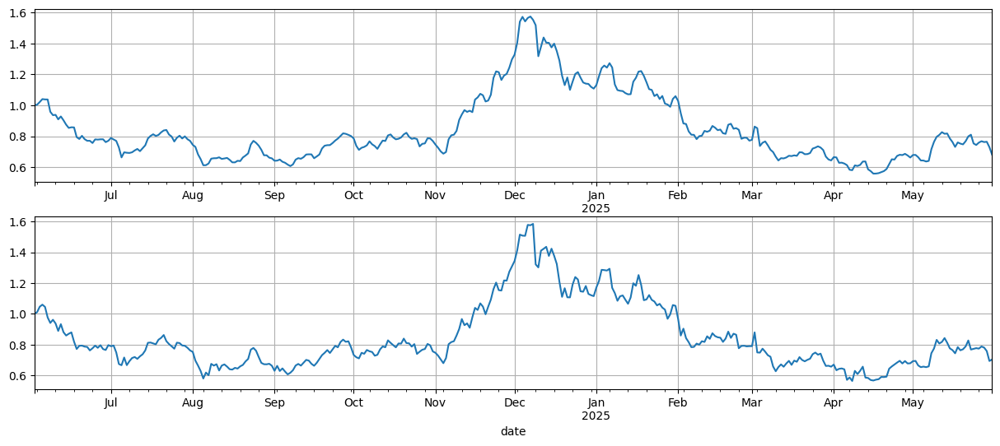

In [5]:
start_time = '2024-06-01'
end_time = '2025-06-01'
close_filter = close[(close.index > start_time) & (close.index < end_time)]
open_filter = open[(open.index > start_time) & (open.index < end_time)]
high_filter = high[(high.index > start_time) & (high.index < end_time)]
low_filter = low[(low.index > start_time) & (low.index < end_time)]
volume_filter = volume[(volume.index > start_time) & (volume.index < end_time)]
amount_filter = amount[(amount.index > start_time) & (amount.index < end_time)]
vwap_filter = vwap[(vwap.index > start_time) & (vwap.index < end_time)]
return_filter = return_[(return_.index > start_time) & (return_.index < end_time)]

benchmark_open_filter = open_filter.mean(axis=1)
benchmark_close_filter = close_filter.mean(axis=1)
volatility = return_filter.rolling(window=10, min_periods=5).std()


import matplotlib.pyplot as plt
_, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 12))
high_norm = high_filter/high_filter.bfill().iloc[0] 
close_norm = close_filter/close_filter.bfill().iloc[0] 
high_norm.mean(axis=1).plot(ax=ax1, figsize=(15,6),grid=True)
close_norm.mean(axis=1).plot(ax=ax2, figsize=(15,6),grid=True);

### 5. Define Factor

In [6]:
import Alpha101 as alpha101

df_data = {
    'open' : open_filter,
    'close' : close_filter,
    'high' : high_filter,
    'low' : low_filter,
    'volume' : volume_filter, 
}

alpha_all_in_one_101 = alpha101.Alphas101(df_data)


import Alpha191 as alpha191

df_data = {
    'open' : open_filter,
    'close' : close_filter,
    'high' : high_filter,
    'low' : low_filter,
    'volume' : volume_filter, 
    'vwap' : vwap_filter,
    'amount': amount_filter,
    'benchmark_open': benchmark_open_filter,
    'benchmark_close': benchmark_close_filter
}

alpha_all_in_one_191 = alpha191.Alphas191(df_data)

In [13]:
def single_alpha_back_test(alpha):
    method = getattr(alpha_all_in_one_101, alpha)
    single_alpha = method() 
    
    # 将因子转换为Alphalens需要的MultiIndex格式
    factor = single_alpha.stack()
    factor.index.names = ['date', 'asset']
    factor = factor.dropna()  # 清理缺失值
    price = close_filter
    
    factor_data = alphalens.utils.get_clean_factor_and_forward_returns(
        factor=factor,
        prices=price,
        periods=(1,),
        quantiles=3
    )
    
    mean_return_by_q, _ = alphalens.performance.mean_return_by_quantile(
        factor_data,
        by_date=True,  # 按日期计算
        demeaned=False,  # 是否对收益去均值（Long-Short 需设为 True）
        group_adjust=False
    )
    
    top_quantile_daily = mean_return_by_q.loc[3]  # 最高分组每日收益
    bottom_quantile_daily = mean_return_by_q.loc[1]  # 最低分组每日收益
    long_short_daily = top_quantile_daily - bottom_quantile_daily # 计算 Long-Short 组合（最高减最低）
    
    # 计算累计收益
    top_cumulative = alphalens.performance.cumulative_returns(top_quantile_daily)
    bottom_cumulative = alphalens.performance.cumulative_returns(bottom_quantile_daily)
    long_short_cumulative = alphalens.performance.cumulative_returns(long_short_daily)
    
    
    # 绘制图表
    plt.figure(figsize=(14, 7))
    plt.plot(top_cumulative, 'g', label='Top Quantile (Q3)', linewidth=2)
    plt.plot(bottom_cumulative, 'r', label='Bottom Quantile (Q1)', linewidth=2)
    plt.plot(long_short_cumulative, 'b', label='Long-Short (Top - Bottom)', linewidth=2)
    
    # 设置标题和标签
    plt.title(f'Cumulative Returns: {alpha}', fontsize=14)
    plt.xlabel('Date', fontsize=12)
    plt.ylabel('Cumulative Return', fontsize=12)
    plt.legend(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.show()

Dropped 82.8% entries from factor data: 0.3% in forward returns computation and 82.5% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
 alpha001 error continue
Dropped 14.4% entries from factor data: 13.0% in forward returns computation and 1.4% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


ValueError: Image size of 1400x70700 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 1400x70700 with 101 Axes>

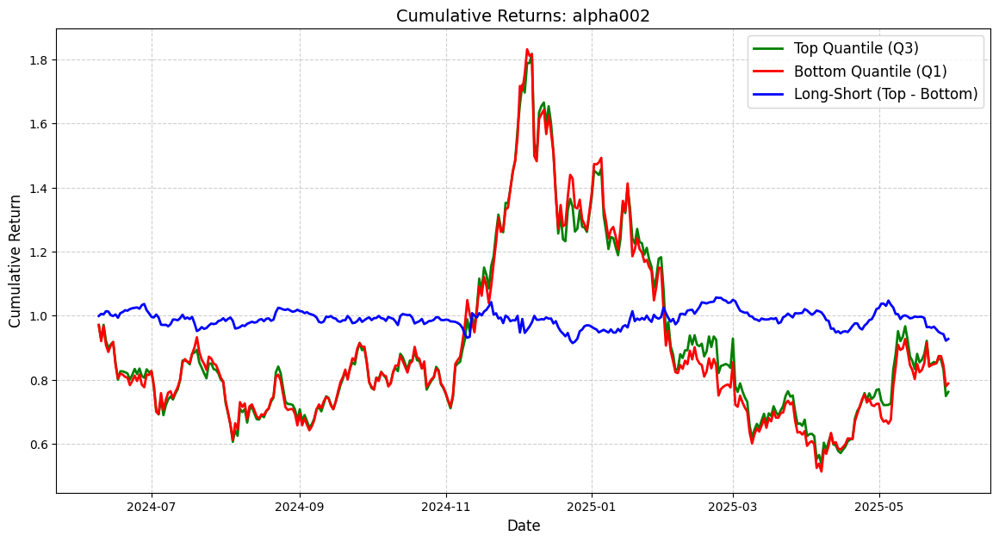

Dropped 15.9% entries from factor data: 13.0% in forward returns computation and 2.9% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


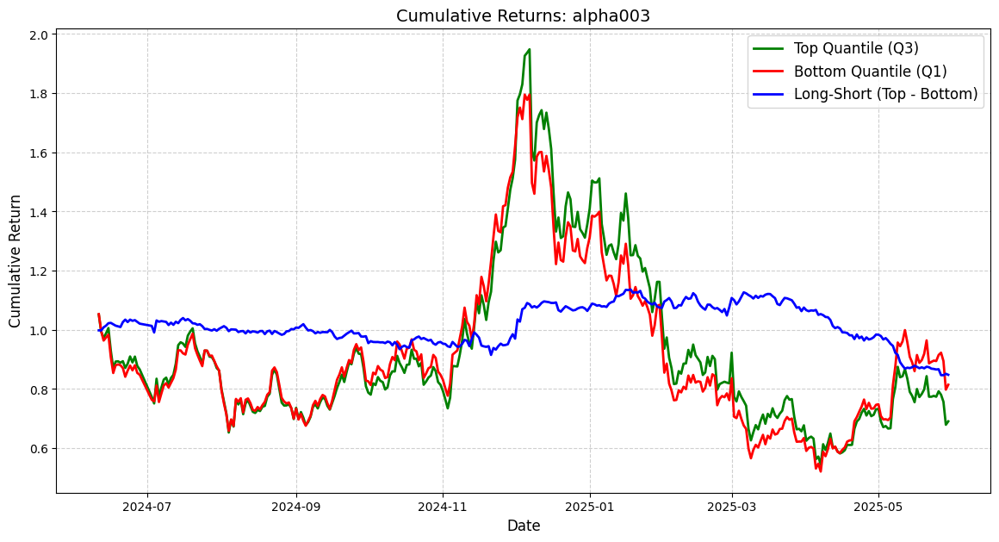

Dropped 74.1% entries from factor data: 0.3% in forward returns computation and 73.8% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
 alpha004 error continue
Dropped 0.3% entries from factor data: 0.3% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


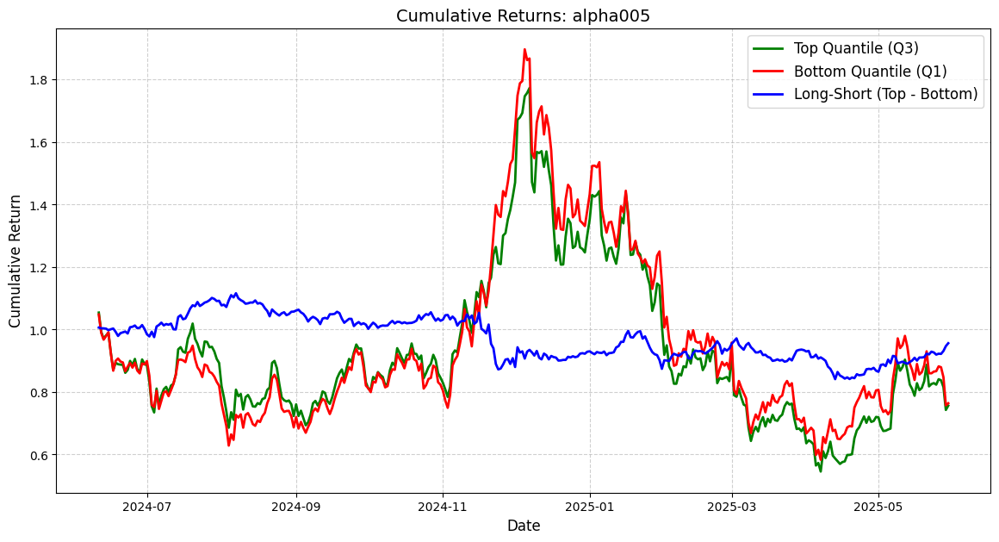

Dropped 14.8% entries from factor data: 13.0% in forward returns computation and 1.8% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


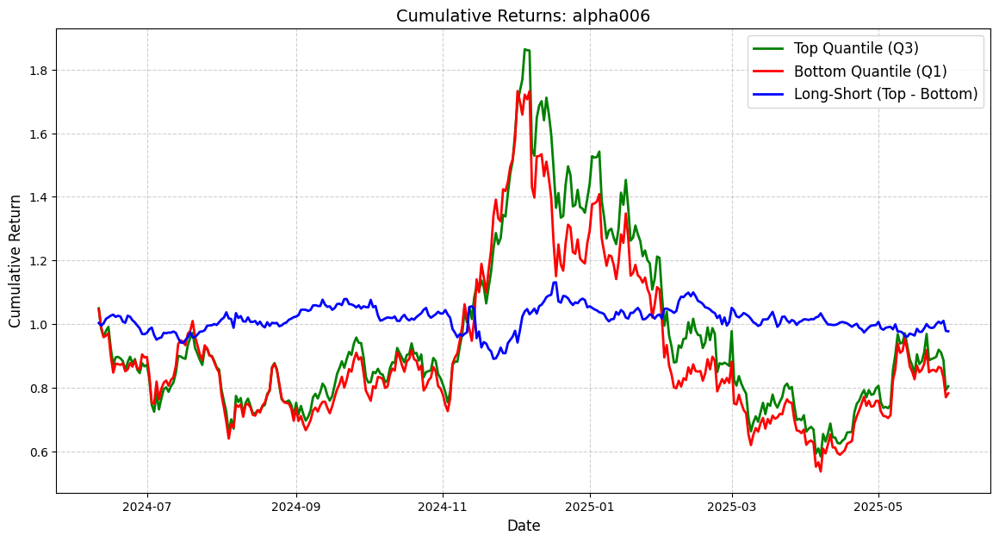

Dropped 69.7% entries from factor data: 0.4% in forward returns computation and 69.4% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
 alpha007 error continue
Dropped 0.3% entries from factor data: 0.3% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


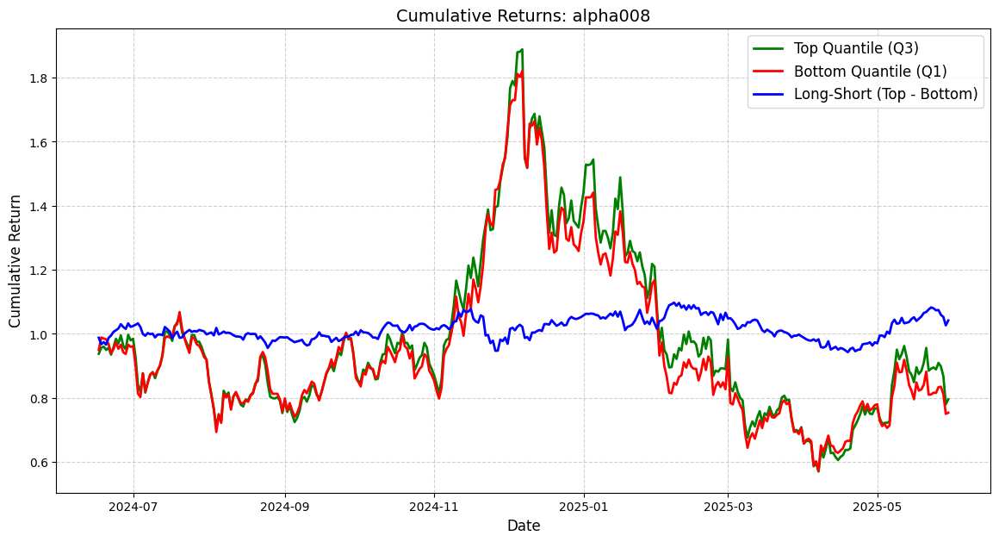

Dropped 0.3% entries from factor data: 0.3% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


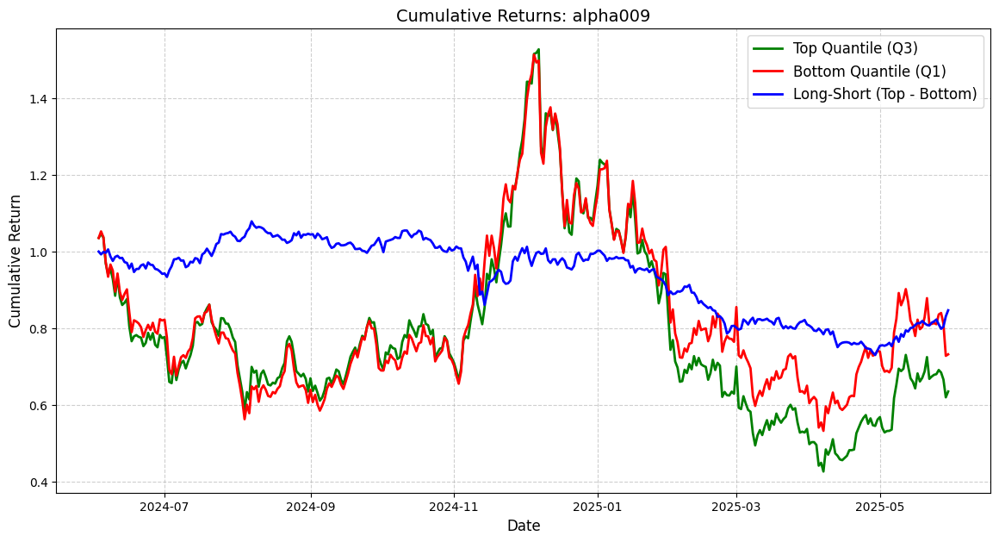

Dropped 0.3% entries from factor data: 0.3% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


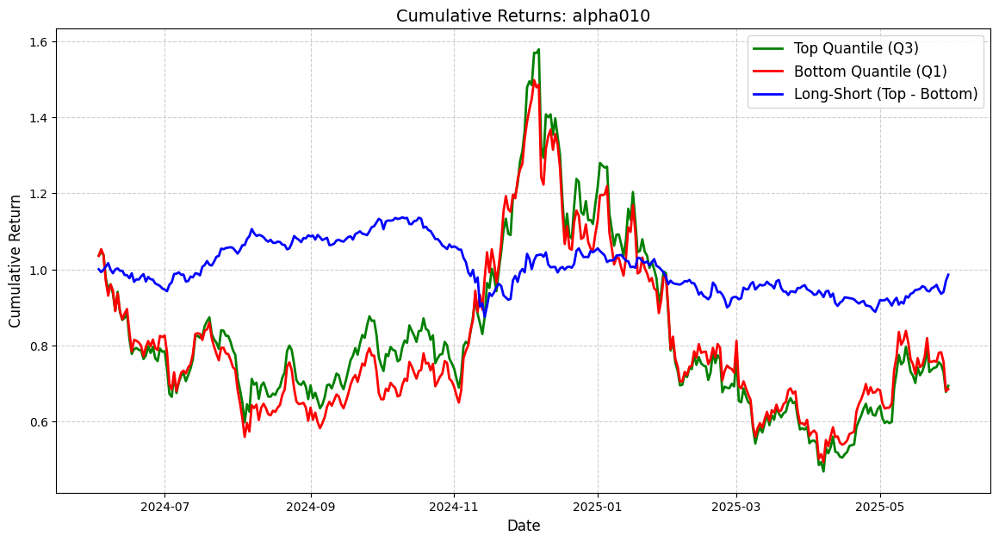

Dropped 0.3% entries from factor data: 0.3% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


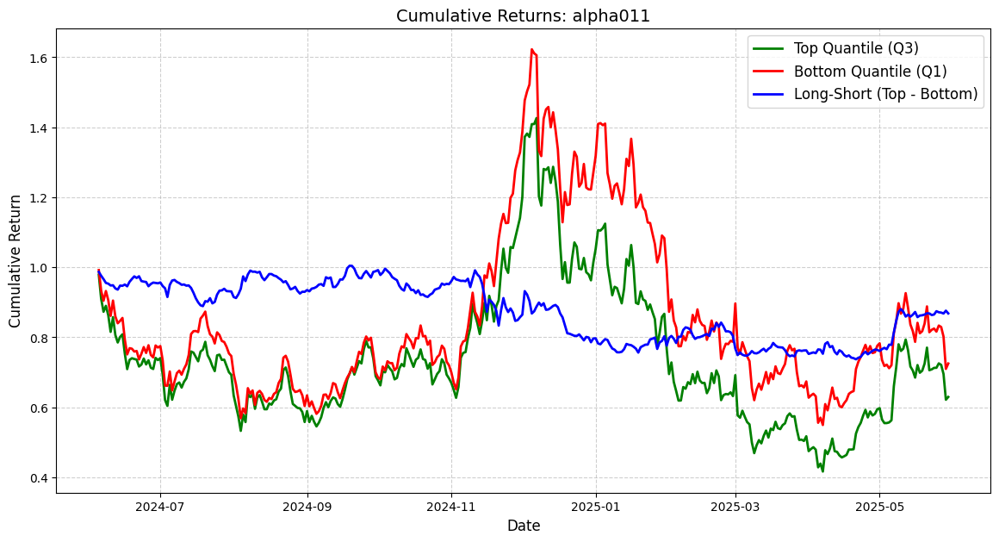

Dropped 0.3% entries from factor data: 0.3% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


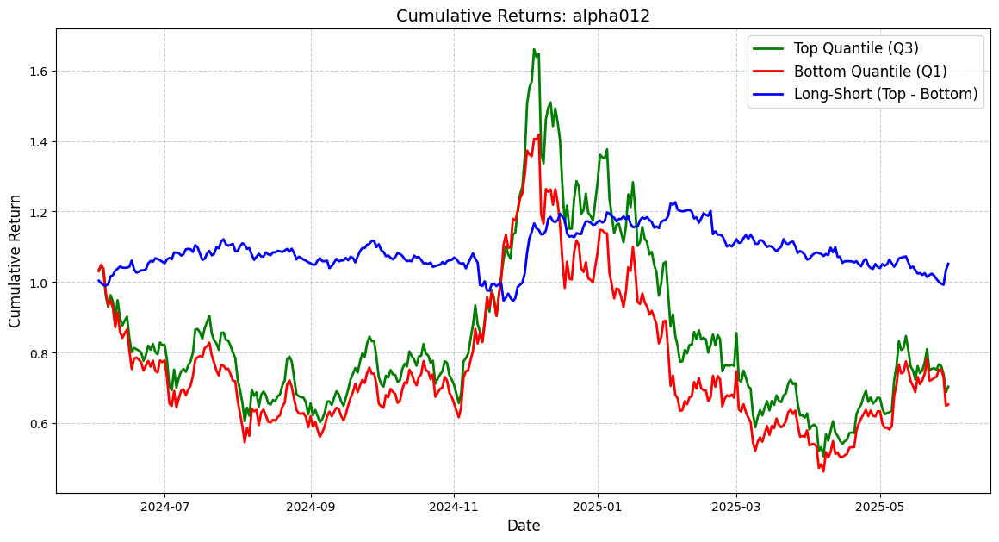

Dropped 0.6% entries from factor data: 0.3% in forward returns computation and 0.3% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


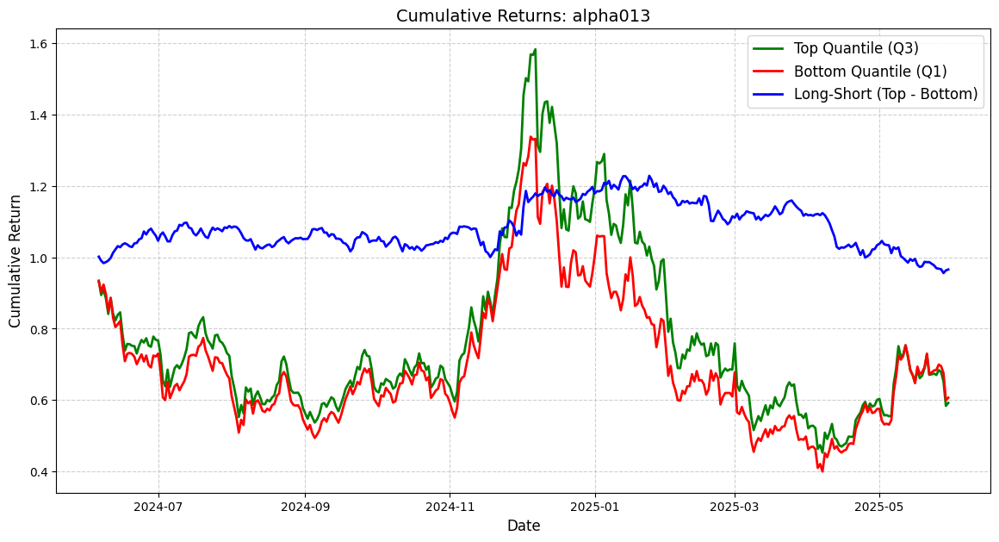

Dropped 1.5% entries from factor data: 0.3% in forward returns computation and 1.2% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


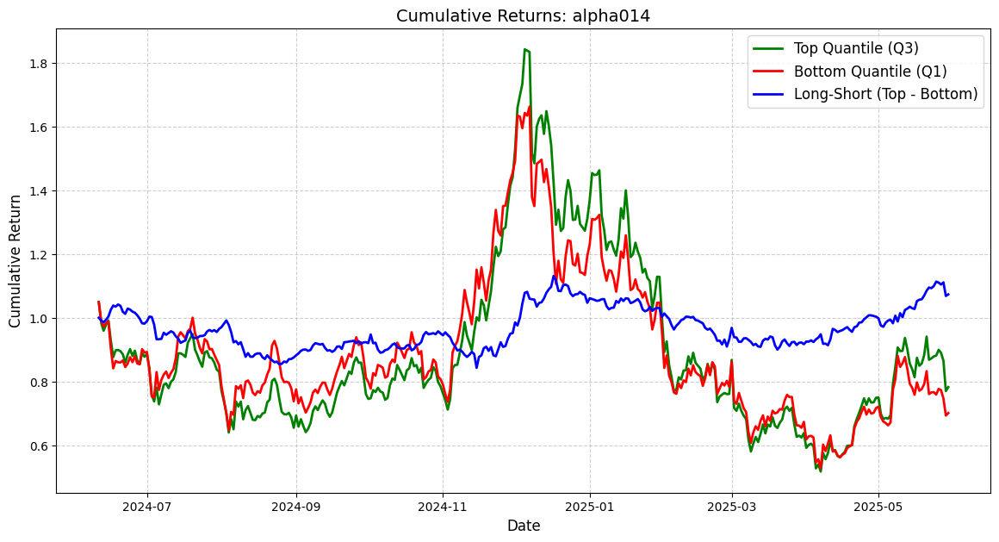

Dropped 13.1% entries from factor data: 12.9% in forward returns computation and 0.2% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


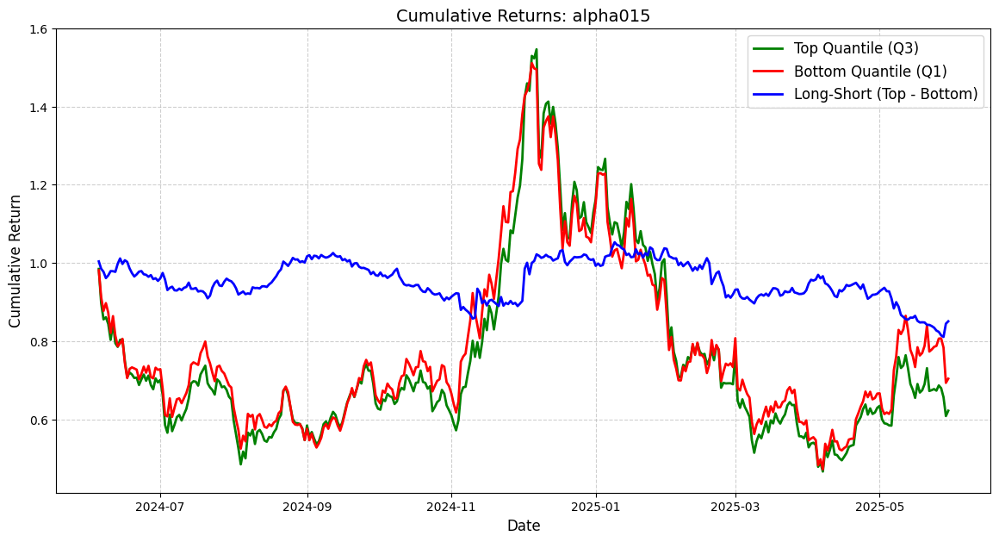

Dropped 0.6% entries from factor data: 0.3% in forward returns computation and 0.2% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


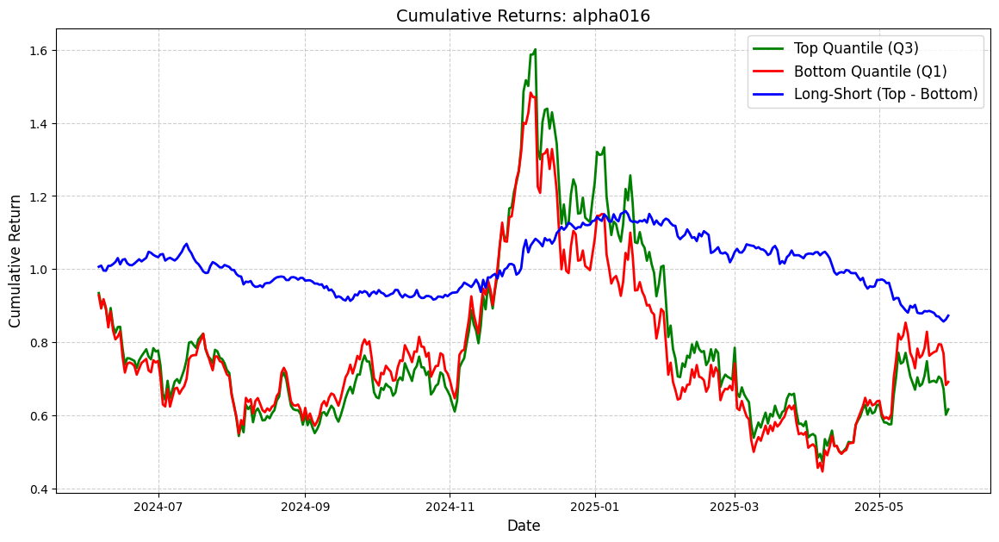

Dropped 0.3% entries from factor data: 0.3% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


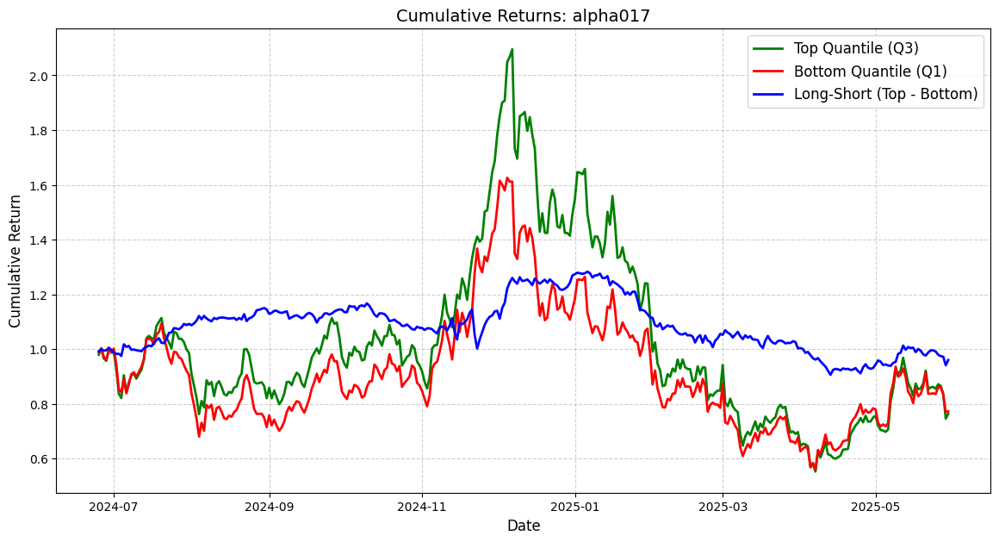

Dropped 0.3% entries from factor data: 0.3% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


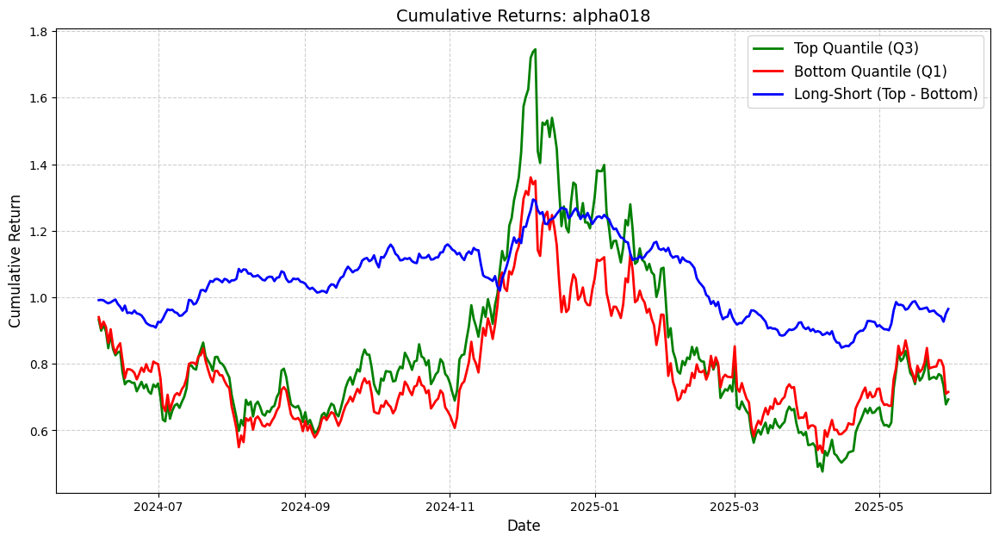

Dropped 0.9% entries from factor data: 0.9% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


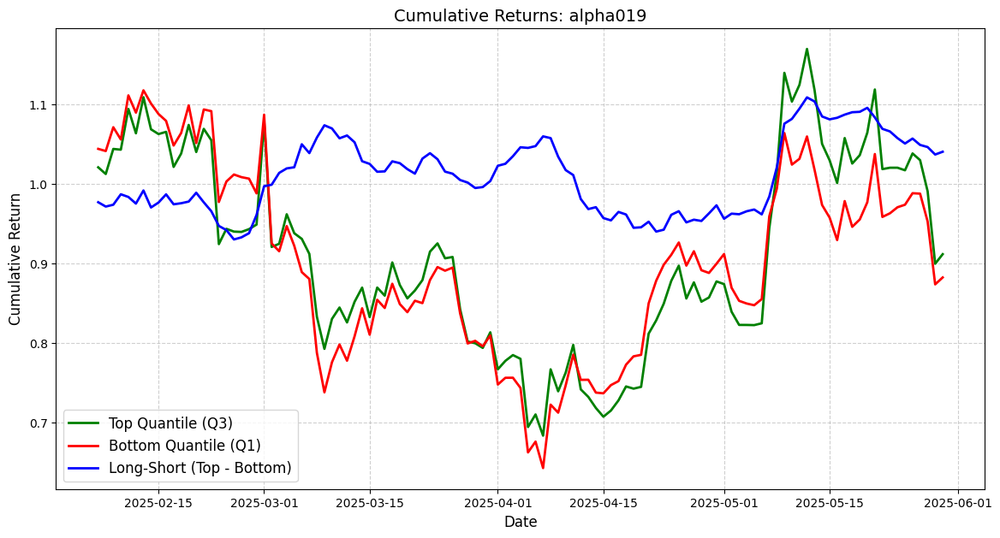

Dropped 0.3% entries from factor data: 0.3% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


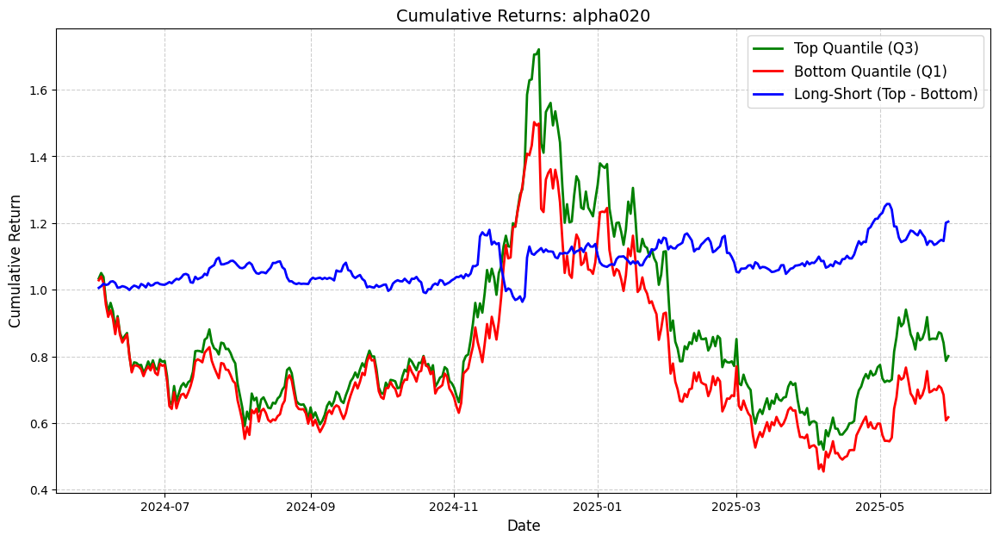

Dropped 100.0% entries from factor data: 13.0% in forward returns computation and 87.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
 alpha021 error continue
Dropped 0.3% entries from factor data: 0.3% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


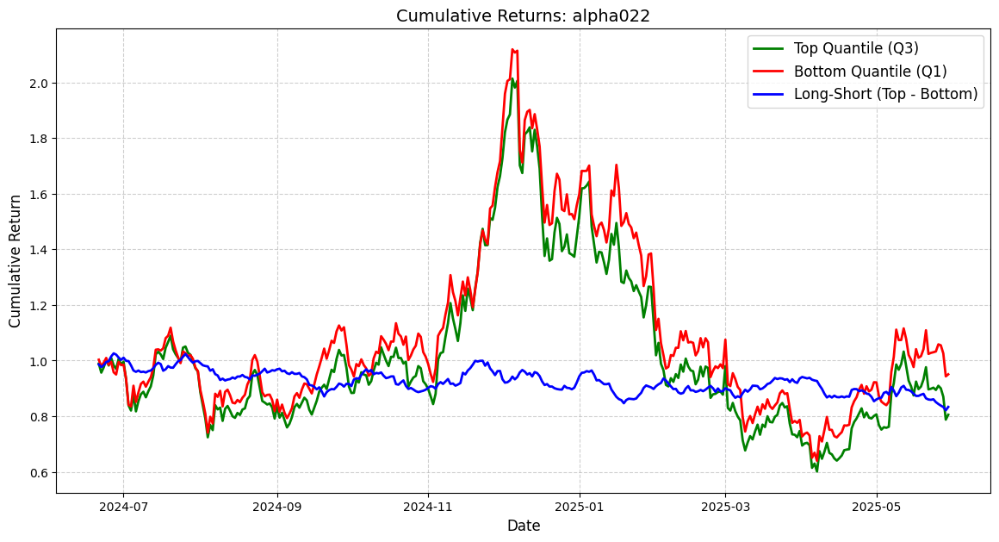

Dropped 67.6% entries from factor data: 13.0% in forward returns computation and 54.6% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
 alpha023 error continue
Dropped 1.3% entries from factor data: 0.3% in forward returns computation and 0.9% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


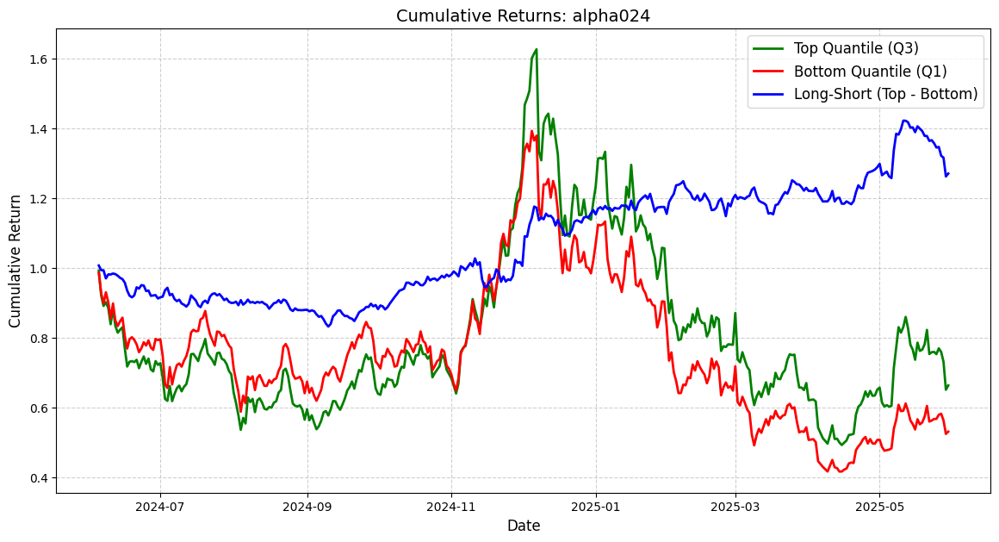

Dropped 0.3% entries from factor data: 0.3% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


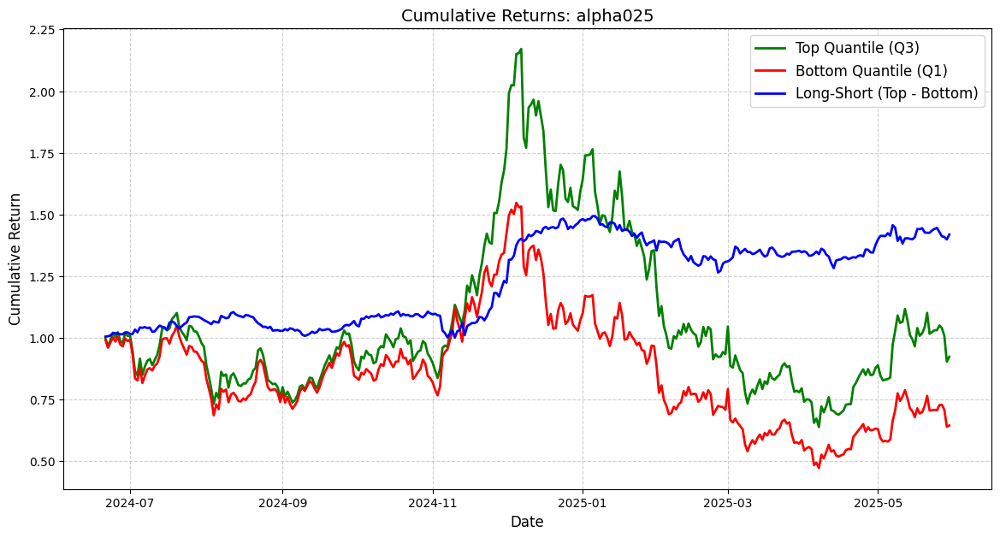

Dropped 14.8% entries from factor data: 12.9% in forward returns computation and 1.9% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


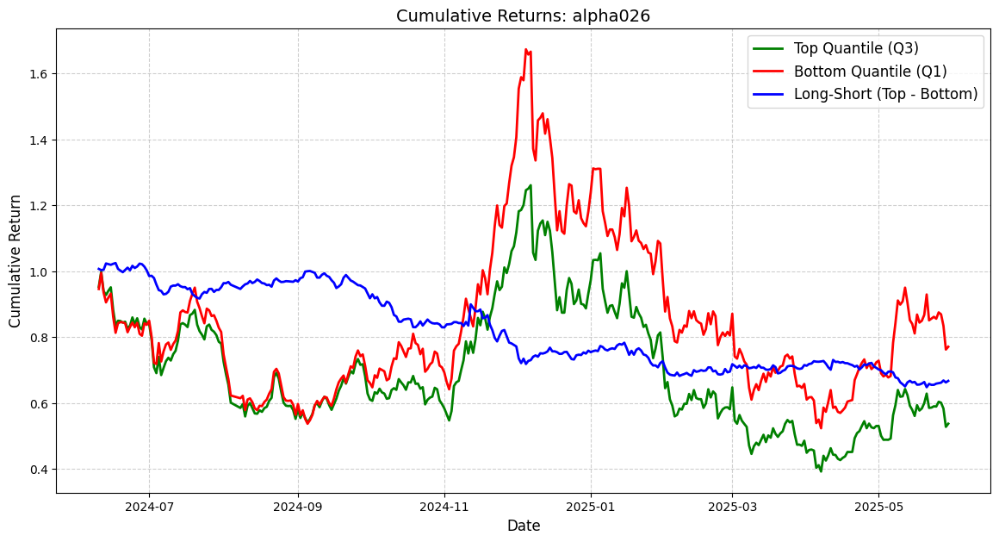

Dropped 100.0% entries from factor data: 13.0% in forward returns computation and 87.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
 alpha027 error continue
Dropped 0.3% entries from factor data: 0.3% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


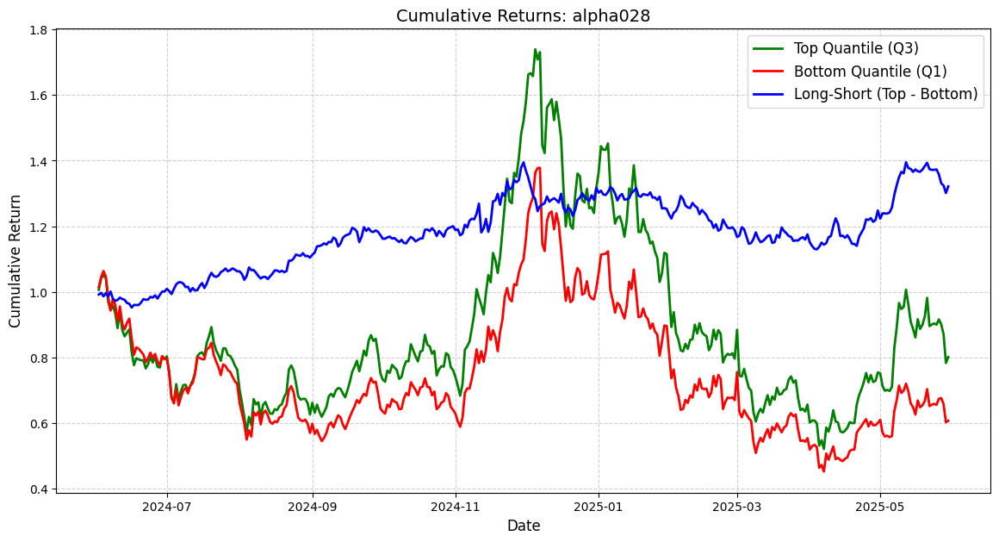

Dropped 0.3% entries from factor data: 0.3% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


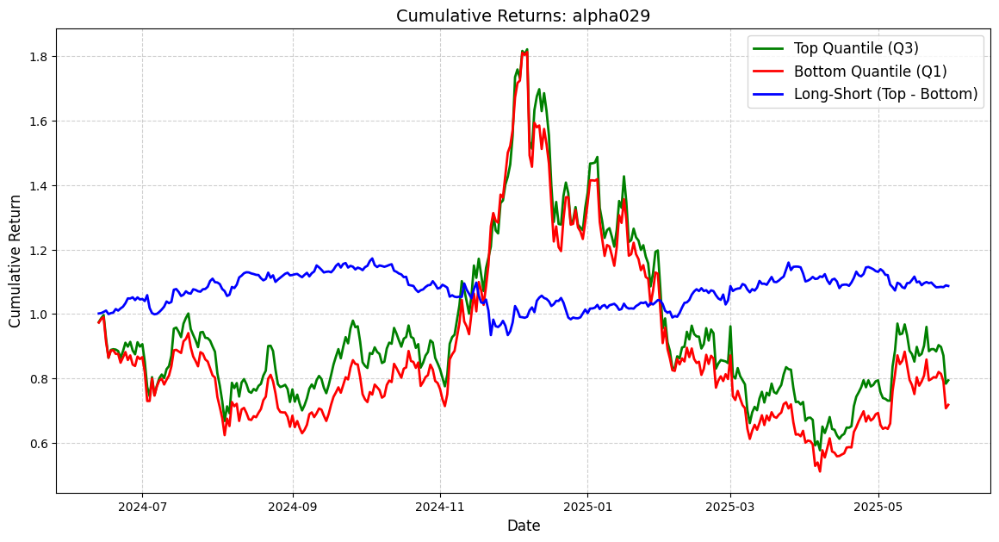

Dropped 0.3% entries from factor data: 0.3% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


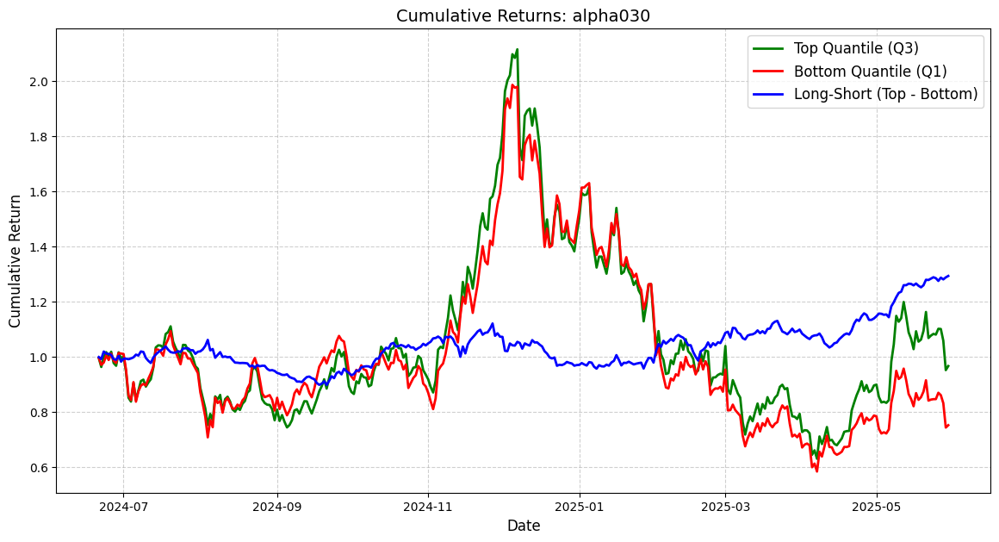

Dropped 0.3% entries from factor data: 0.3% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


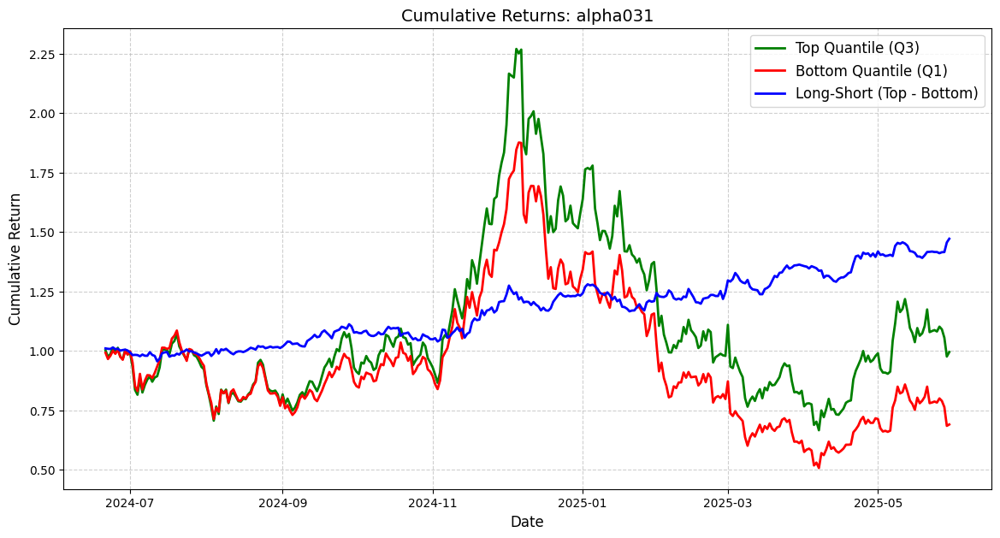

Dropped 0.3% entries from factor data: 0.3% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


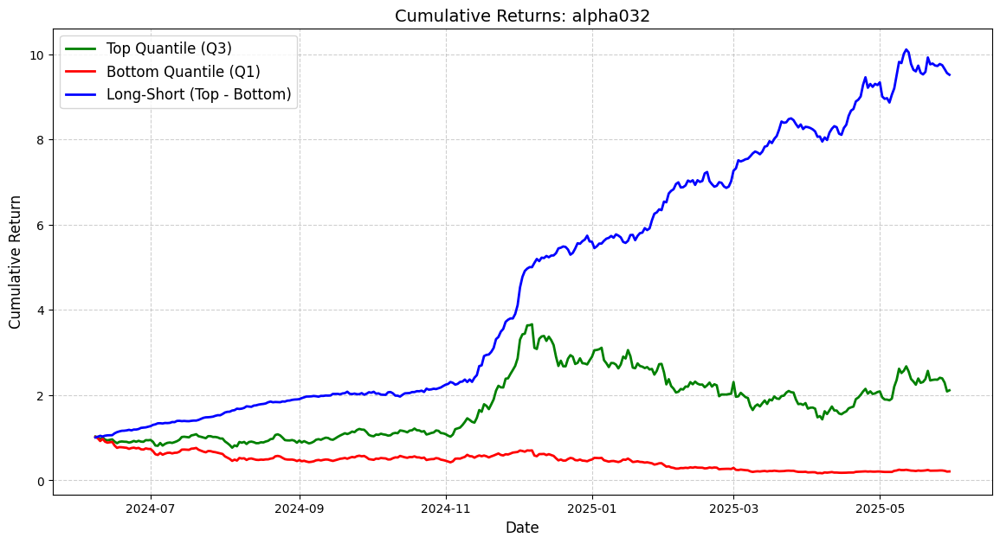

Dropped 0.3% entries from factor data: 0.3% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


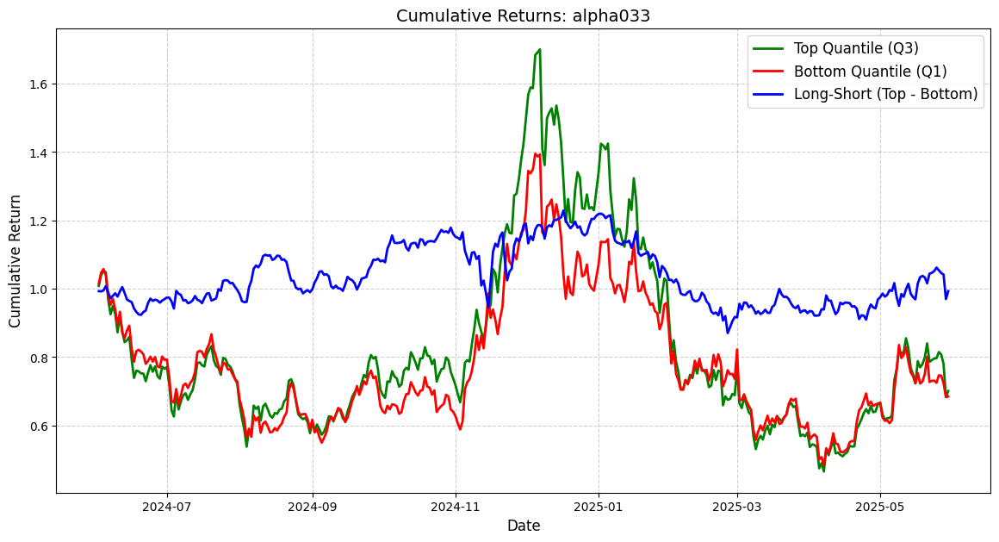

Dropped 0.3% entries from factor data: 0.3% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


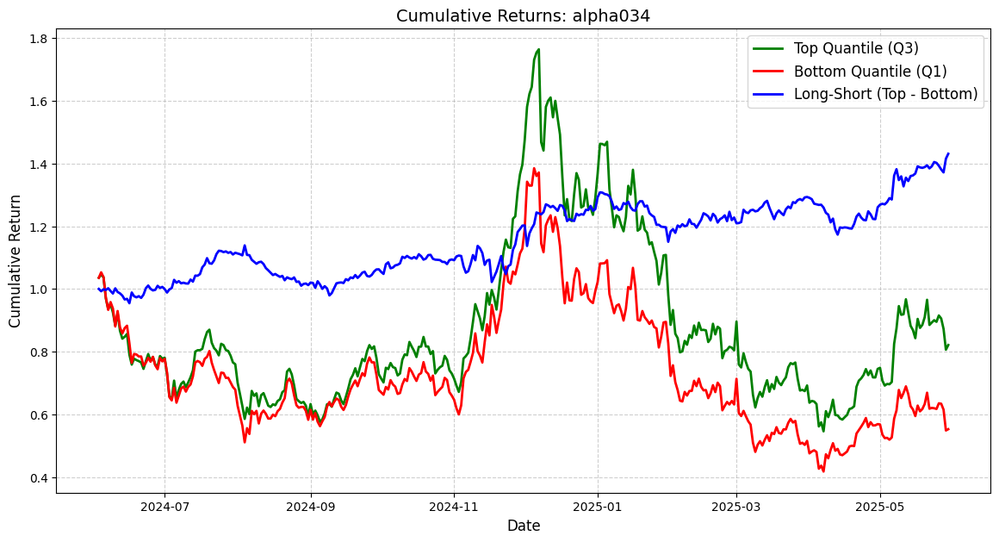

Dropped 23.9% entries from factor data: 0.4% in forward returns computation and 23.6% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


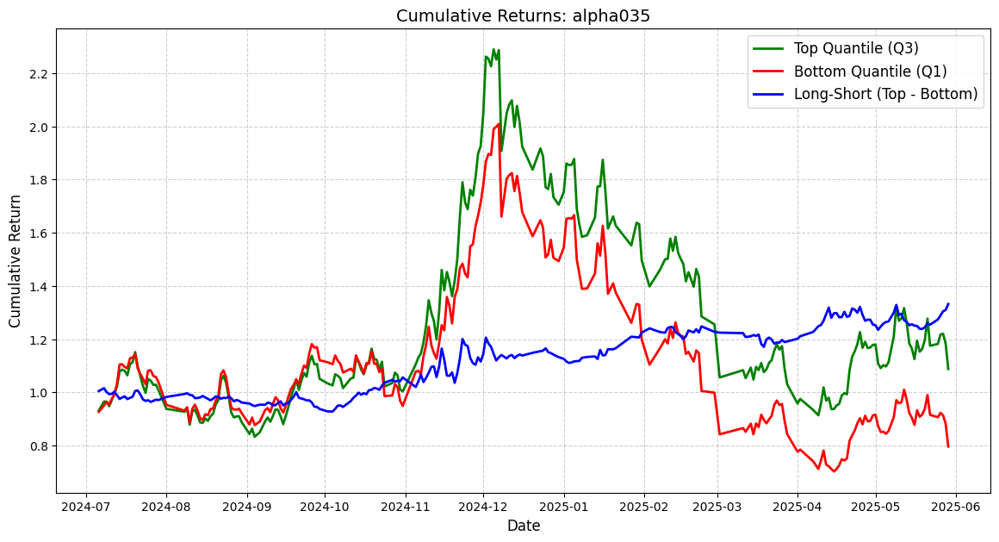

Dropped 0.6% entries from factor data: 0.6% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


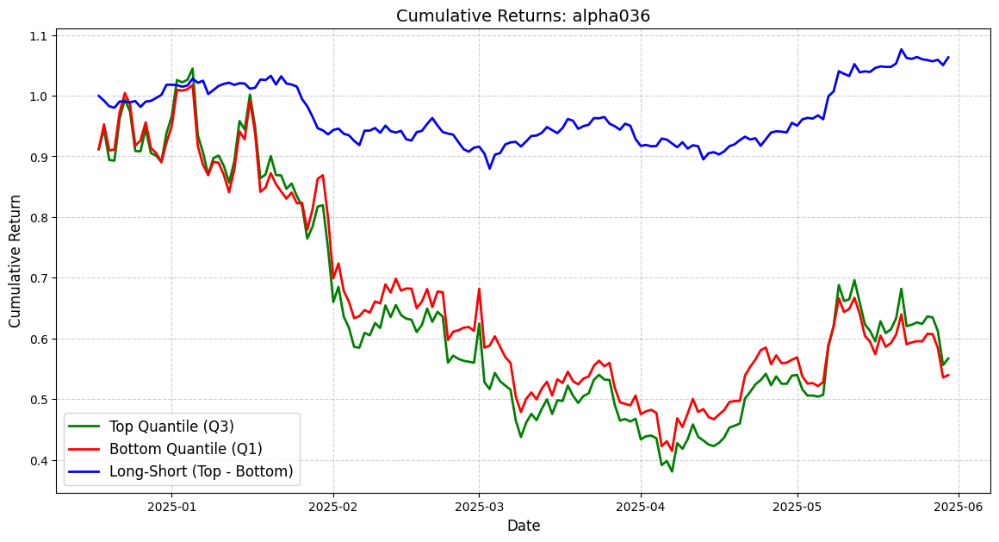

Dropped 0.3% entries from factor data: 0.3% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


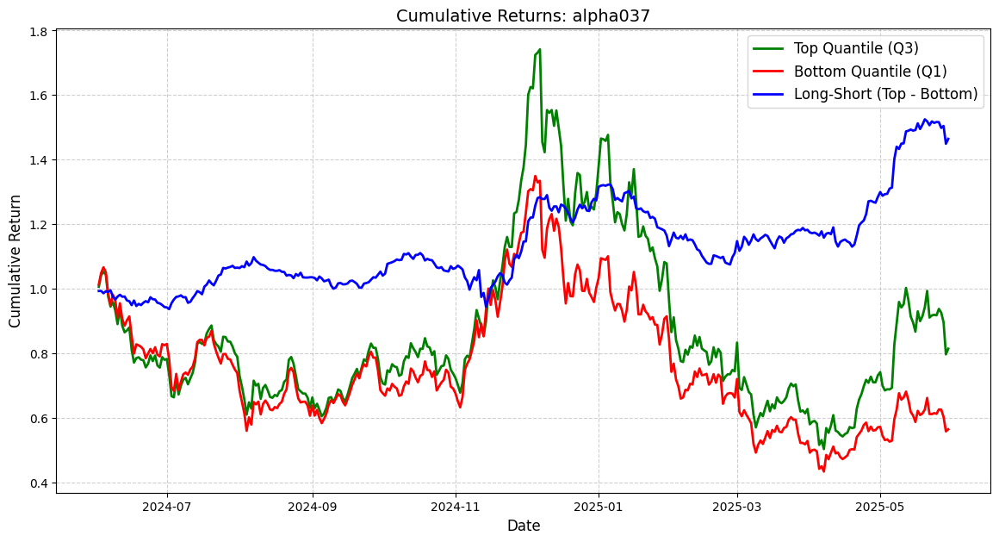

Dropped 0.3% entries from factor data: 0.3% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


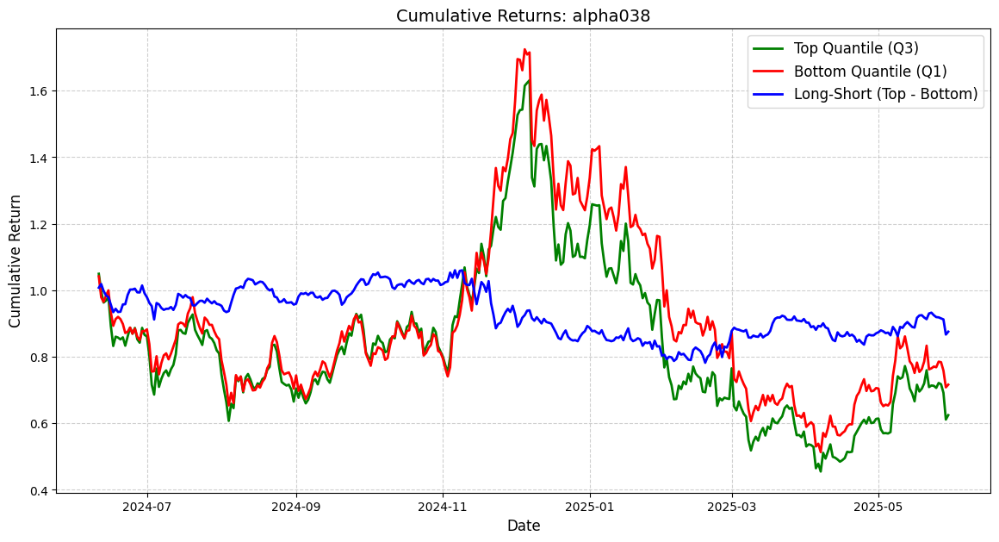

Dropped 0.9% entries from factor data: 0.9% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


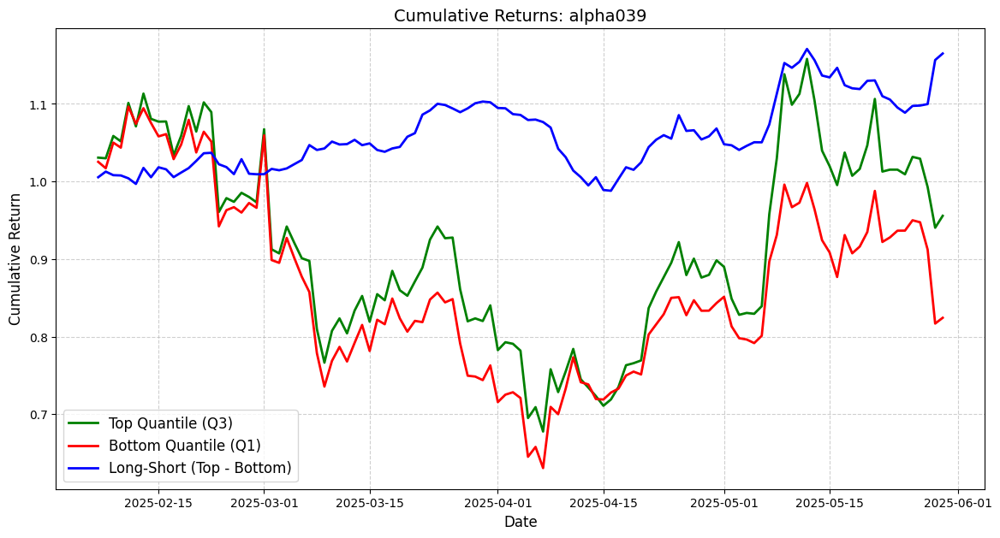

Dropped 0.3% entries from factor data: 0.3% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


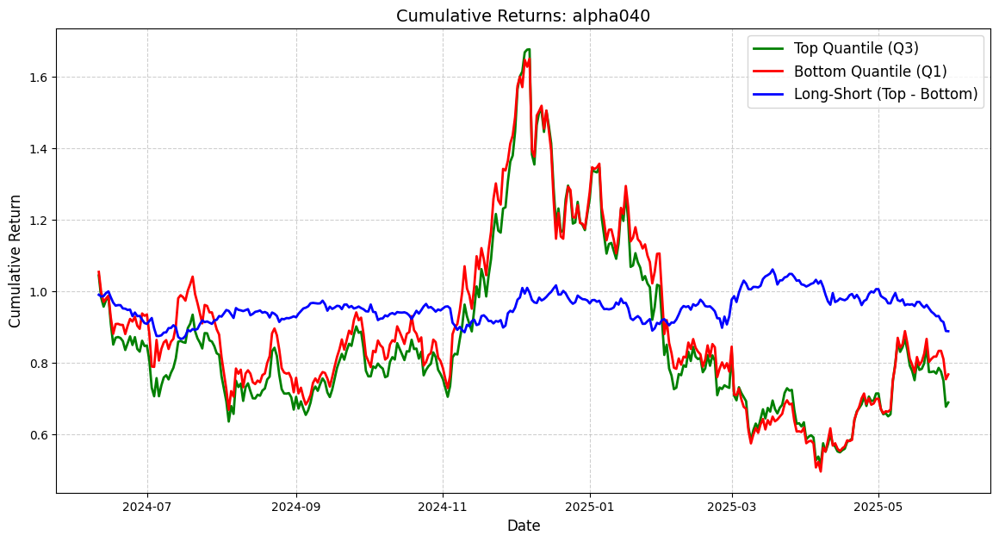

Dropped 0.3% entries from factor data: 0.3% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


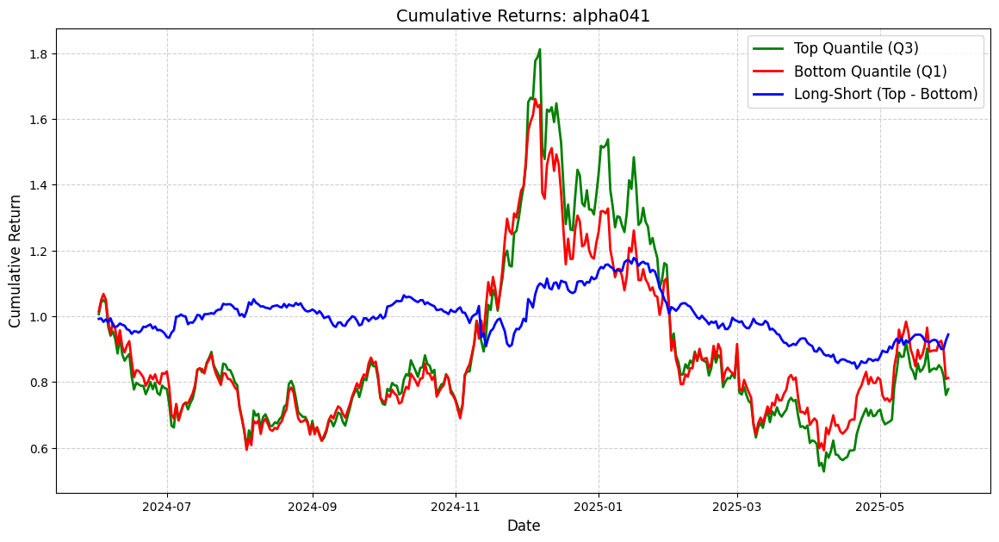

Dropped 0.3% entries from factor data: 0.3% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


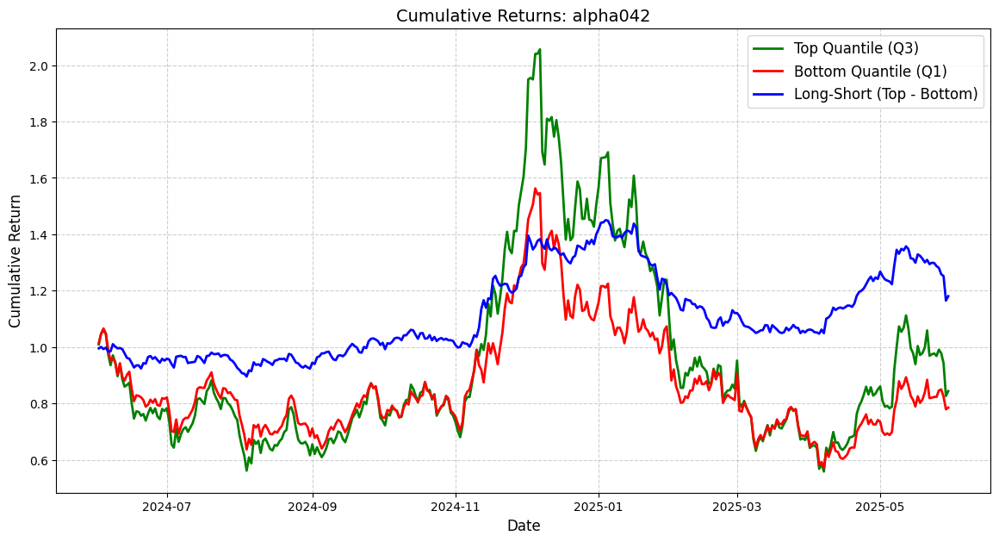

Dropped 2.5% entries from factor data: 0.4% in forward returns computation and 2.1% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


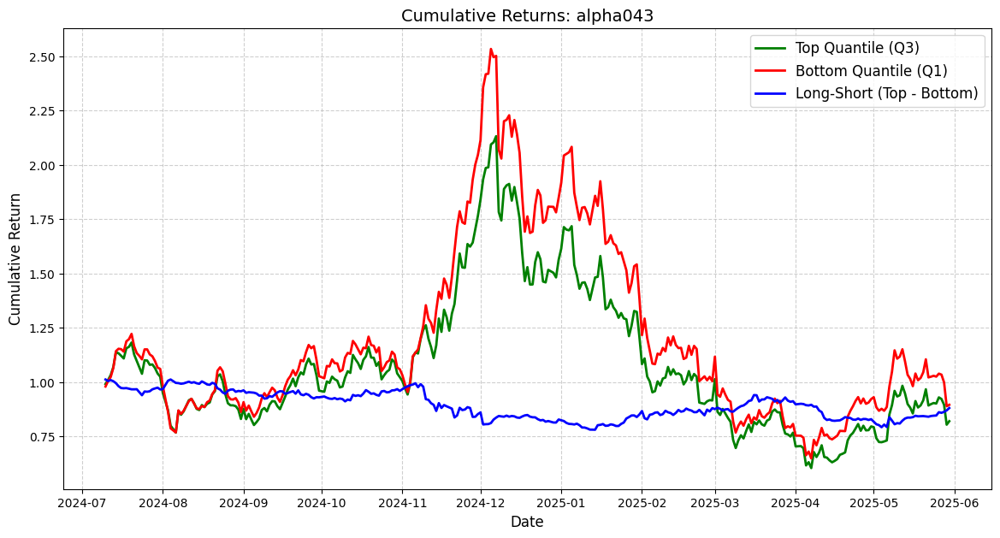

Dropped 13.8% entries from factor data: 13.0% in forward returns computation and 0.8% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


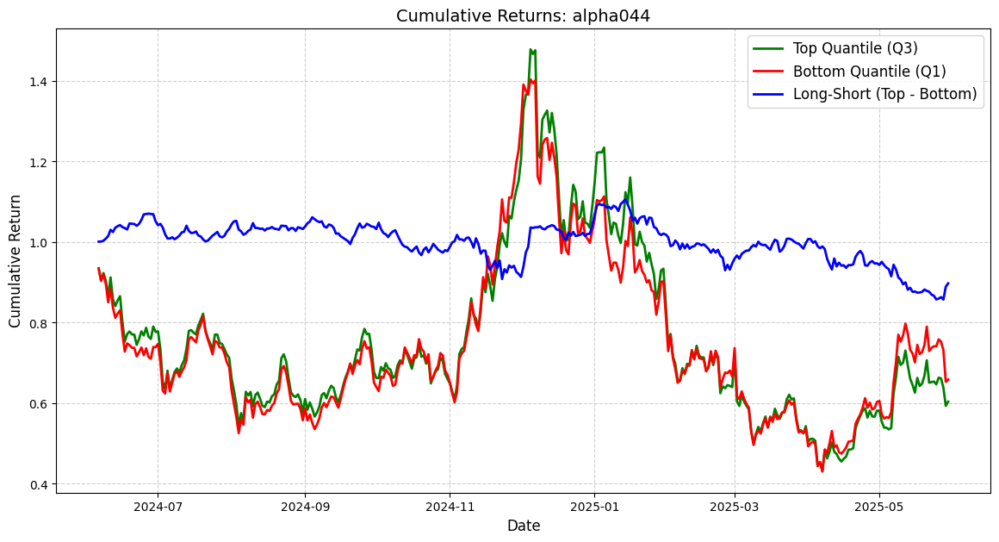

Dropped 0.3% entries from factor data: 0.3% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


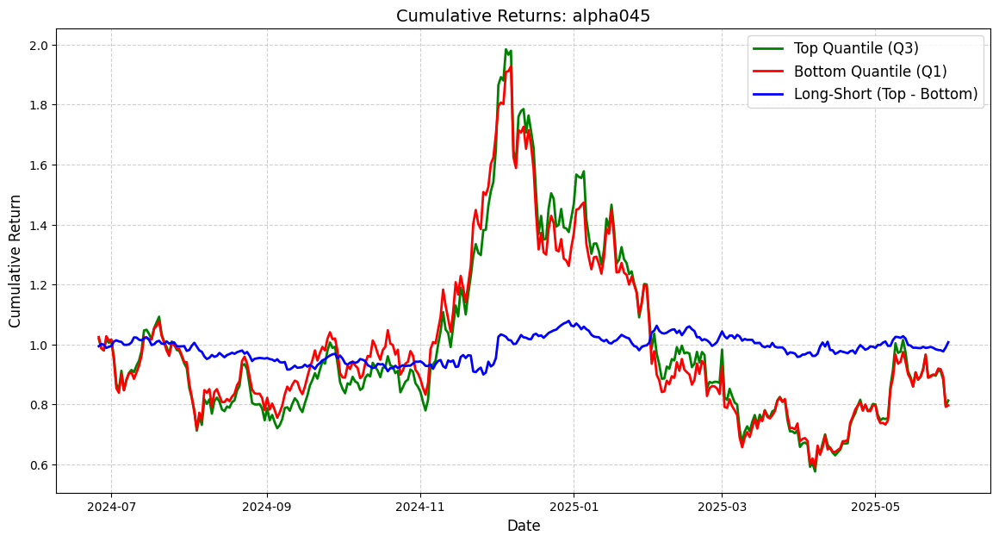

Dropped 44.5% entries from factor data: 0.3% in forward returns computation and 44.2% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
 alpha046 error continue
Dropped 0.3% entries from factor data: 0.3% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


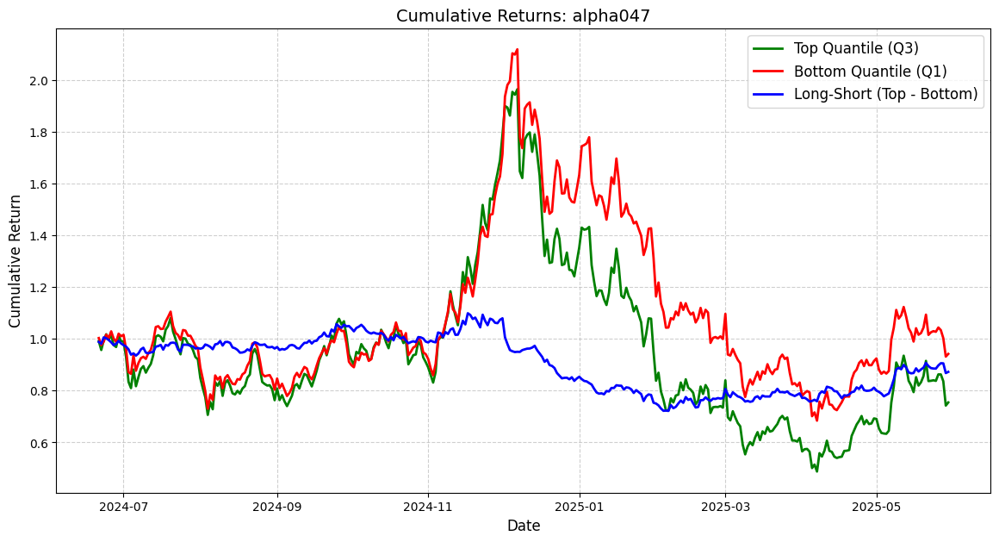

 alpha048 error continue
Dropped 1.9% entries from factor data: 0.3% in forward returns computation and 1.6% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


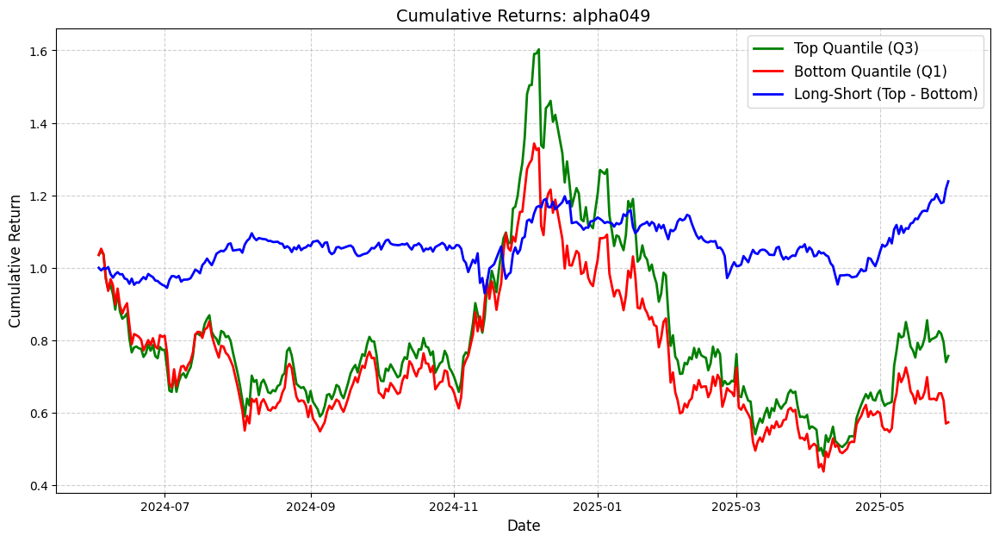

Dropped 12.8% entries from factor data: 12.8% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


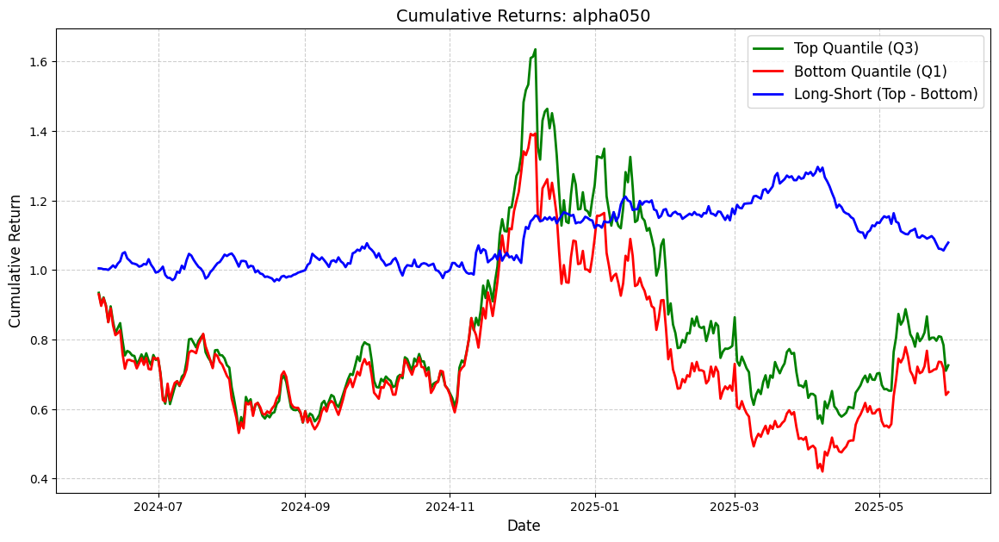

Dropped 9.3% entries from factor data: 0.3% in forward returns computation and 9.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


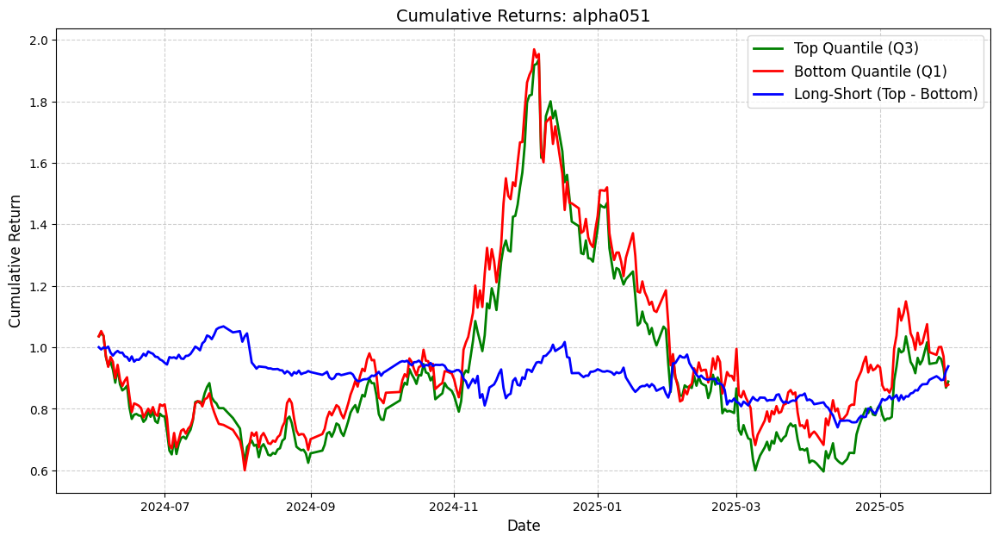

Dropped 0.8% entries from factor data: 0.8% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


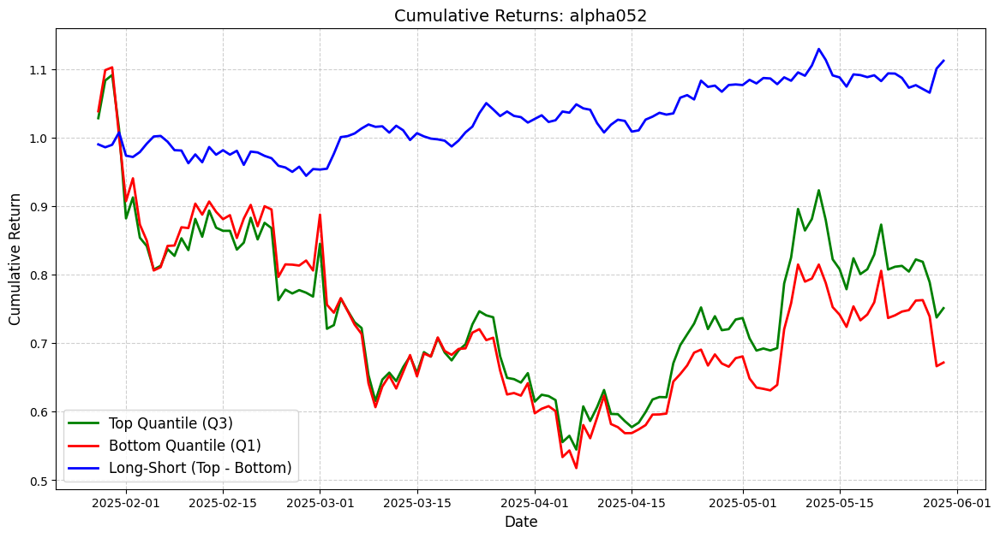

Dropped 0.3% entries from factor data: 0.3% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


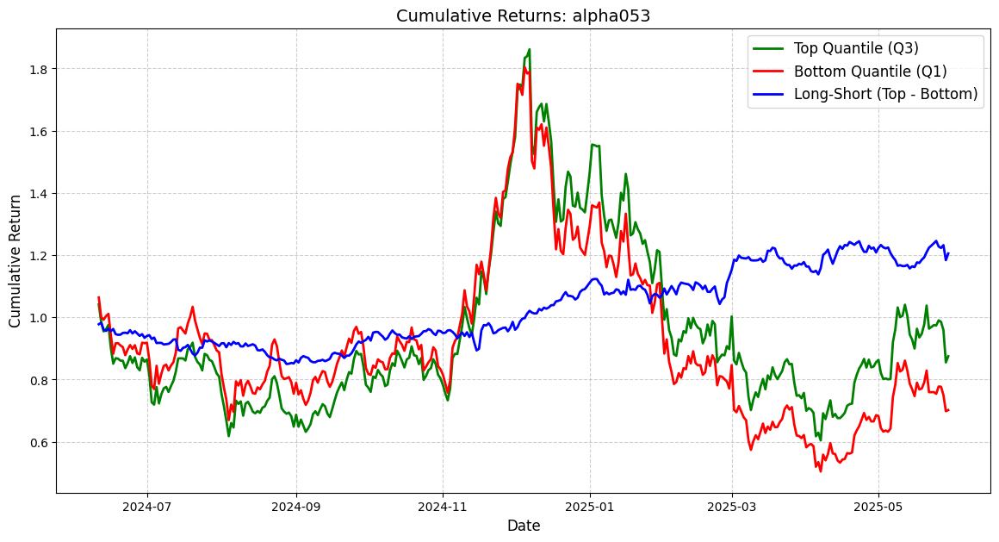

Dropped 0.3% entries from factor data: 0.3% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


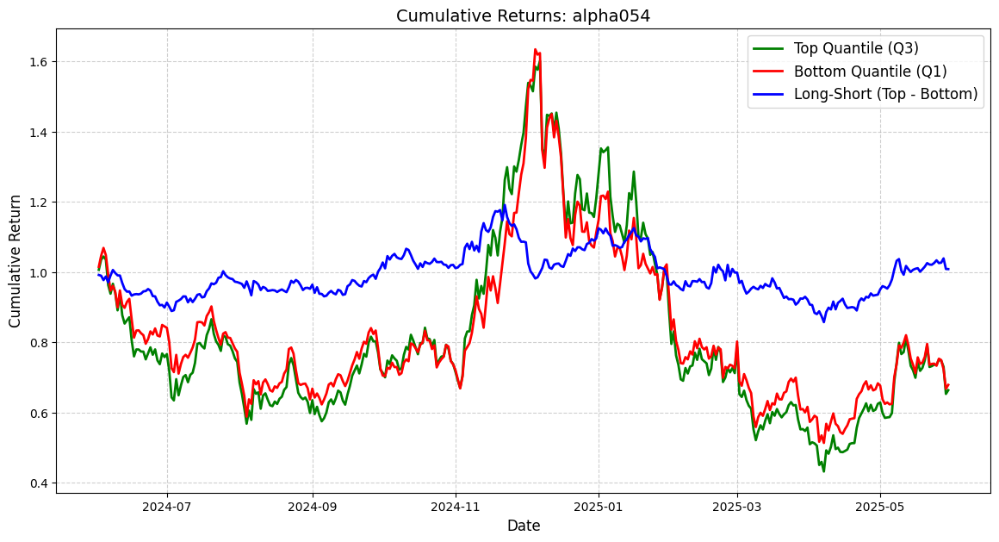

Dropped 16.3% entries from factor data: 13.0% in forward returns computation and 3.3% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


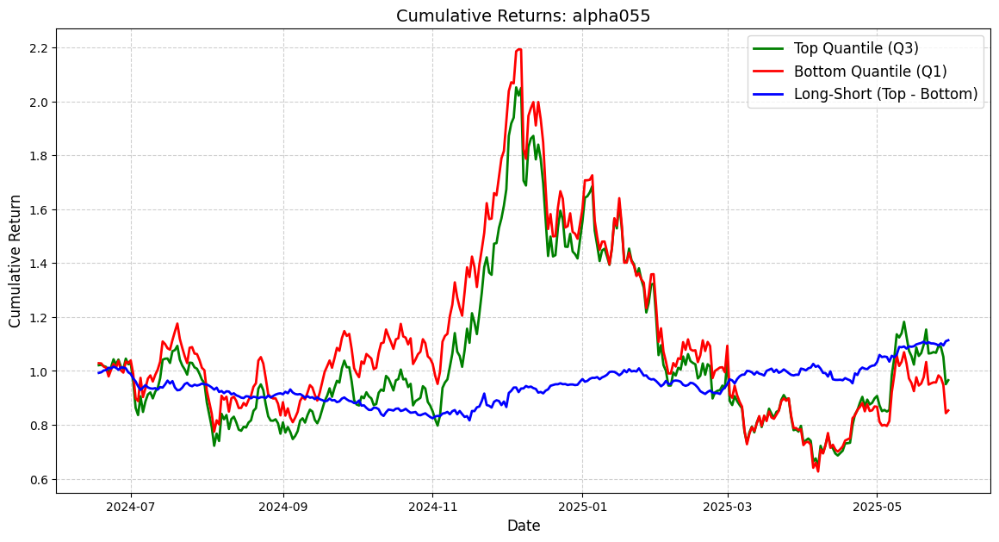

 alpha056 error continue
Dropped 0.3% entries from factor data: 0.3% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


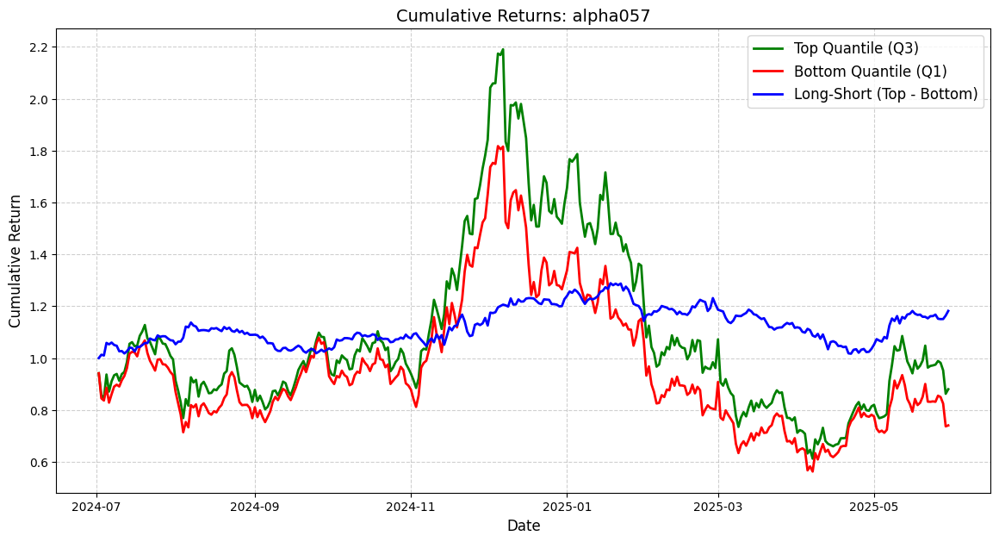

 alpha058 error continue
 alpha059 error continue
Dropped 0.3% entries from factor data: 0.3% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


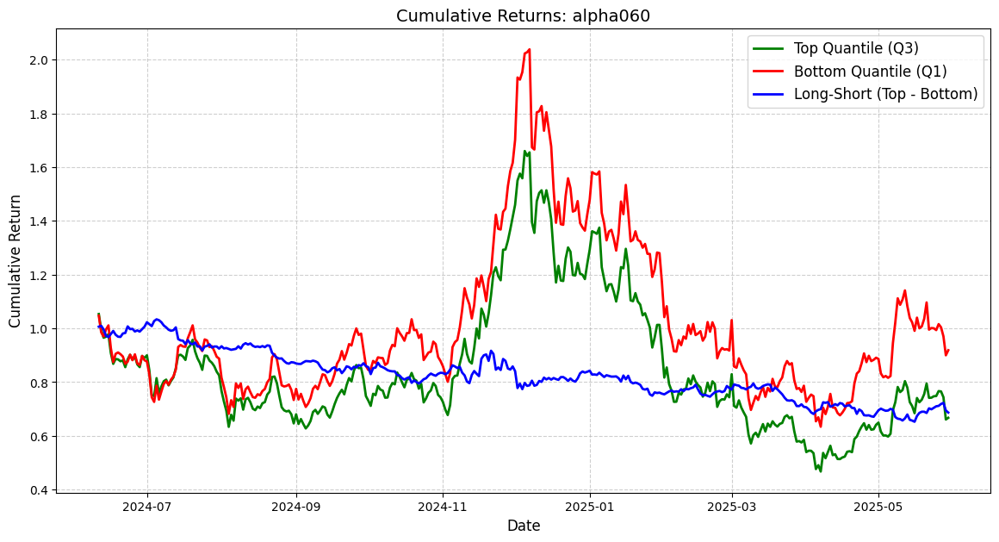

Dropped 100.0% entries from factor data: 13.0% in forward returns computation and 87.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
 alpha061 error continue
Dropped 100.0% entries from factor data: 13.0% in forward returns computation and 87.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
 alpha062 error continue
 alpha063 error continue
Dropped 100.0% entries from factor data: 13.0% in forward returns computation and 87.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
 alpha064 error continue
Dropped 100.0% entries from factor data: 13.0% in forward returns computation and 87.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
 alpha065 error continue
Dropped 0.3% entries from factor data: 0.3% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


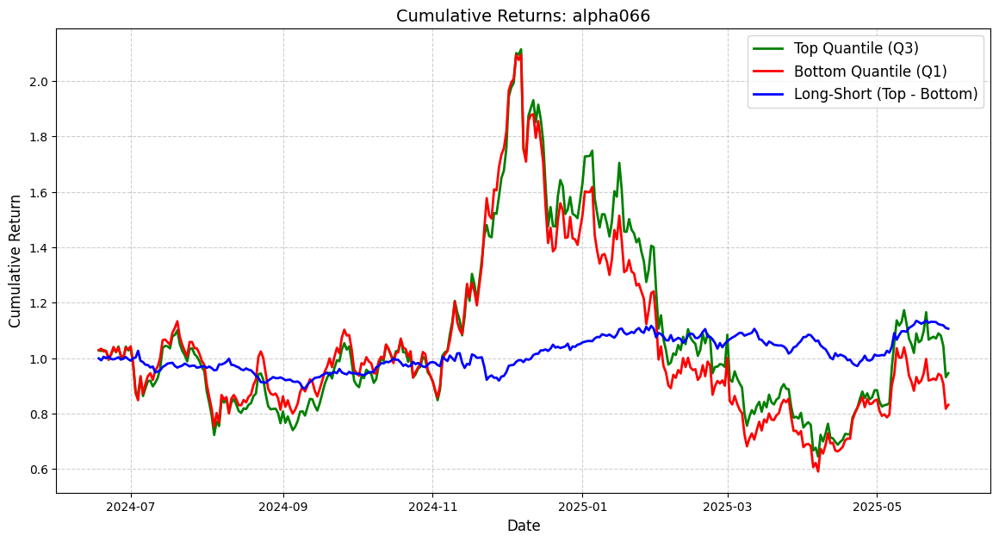

 alpha067 error continue
Dropped 100.0% entries from factor data: 13.0% in forward returns computation and 87.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
 alpha068 error continue
 alpha069 error continue
 alpha070 error continue
Dropped 46.2% entries from factor data: 0.3% in forward returns computation and 45.8% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
 alpha071 error continue
Dropped 15.8% entries from factor data: 12.7% in forward returns computation and 3.2% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


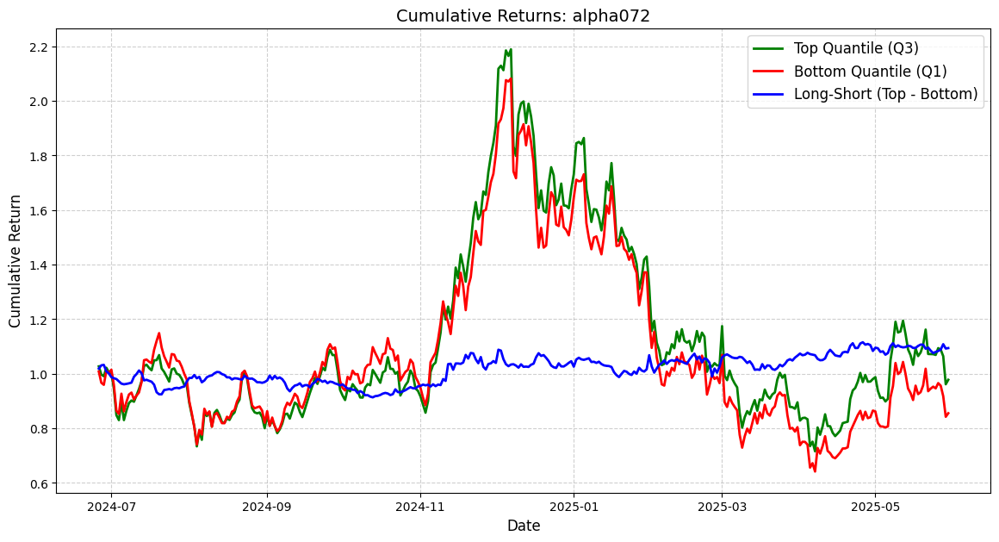

Dropped 20.1% entries from factor data: 0.3% in forward returns computation and 19.7% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


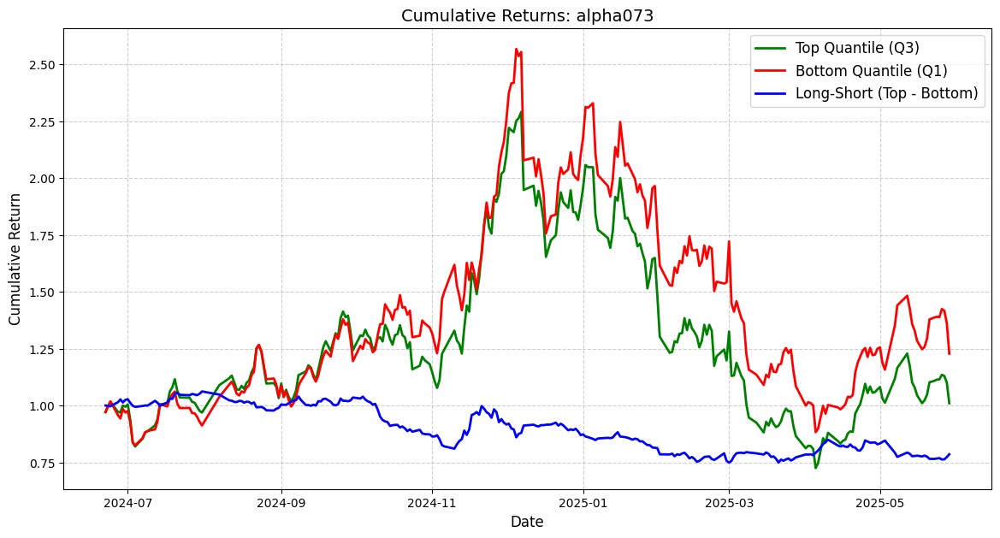

Dropped 100.0% entries from factor data: 13.0% in forward returns computation and 87.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
 alpha074 error continue
Dropped 100.0% entries from factor data: 13.0% in forward returns computation and 87.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
 alpha075 error continue
 alpha076 error continue
Dropped 5.8% entries from factor data: 0.3% in forward returns computation and 5.5% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


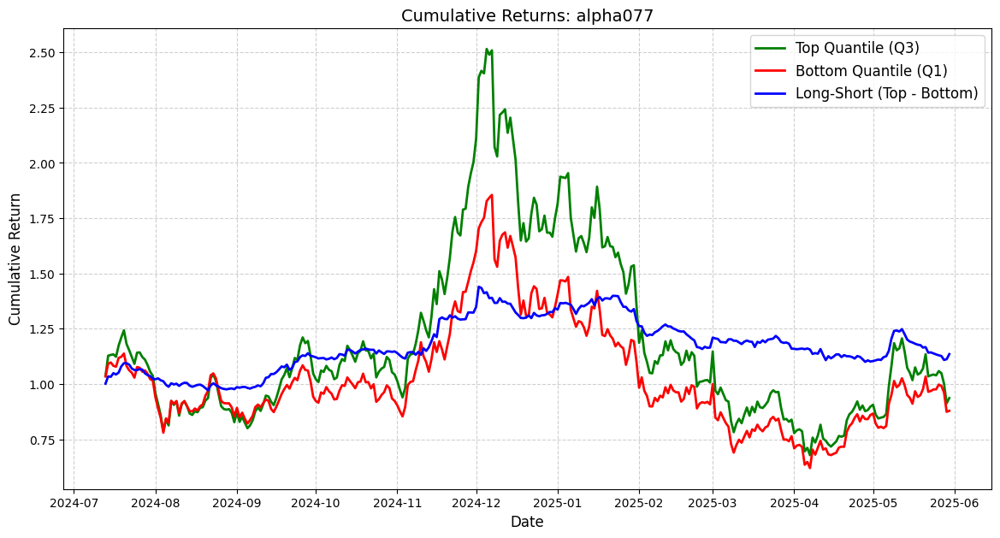

Dropped 17.8% entries from factor data: 13.0% in forward returns computation and 4.8% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


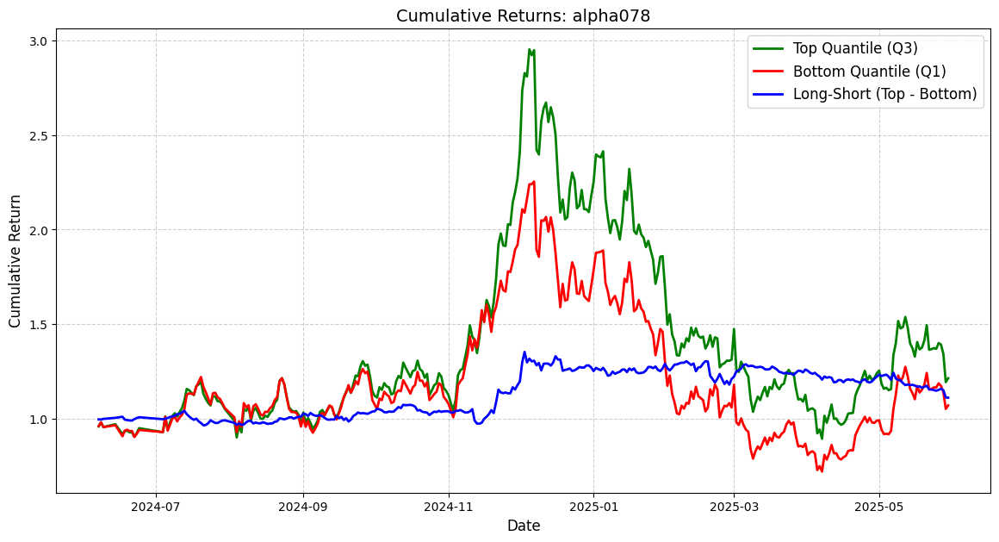

 alpha079 error continue
 alpha080 error continue
Dropped 100.0% entries from factor data: 13.0% in forward returns computation and 87.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
 alpha081 error continue
 alpha082 error continue
Dropped 0.3% entries from factor data: 0.3% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


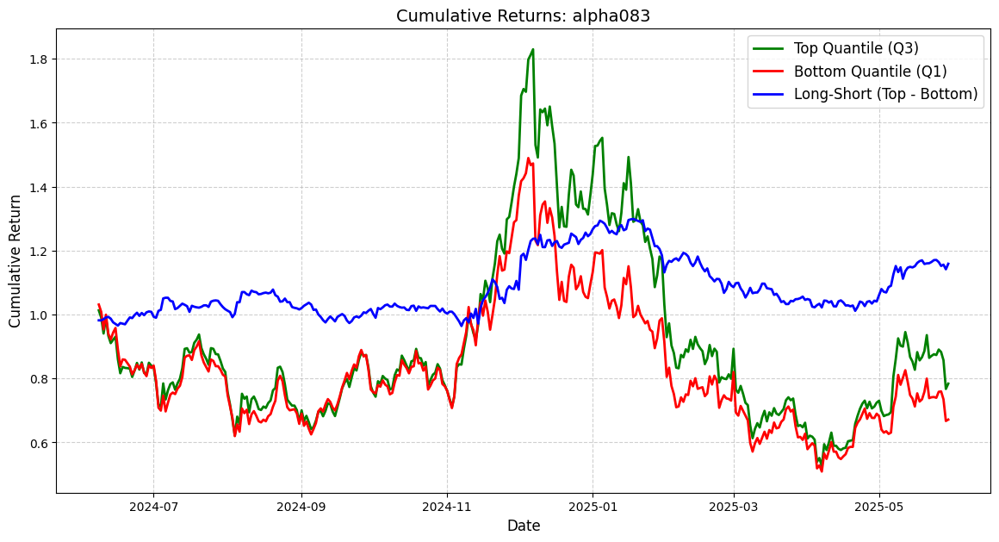

Dropped 7.3% entries from factor data: 0.9% in forward returns computation and 6.5% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


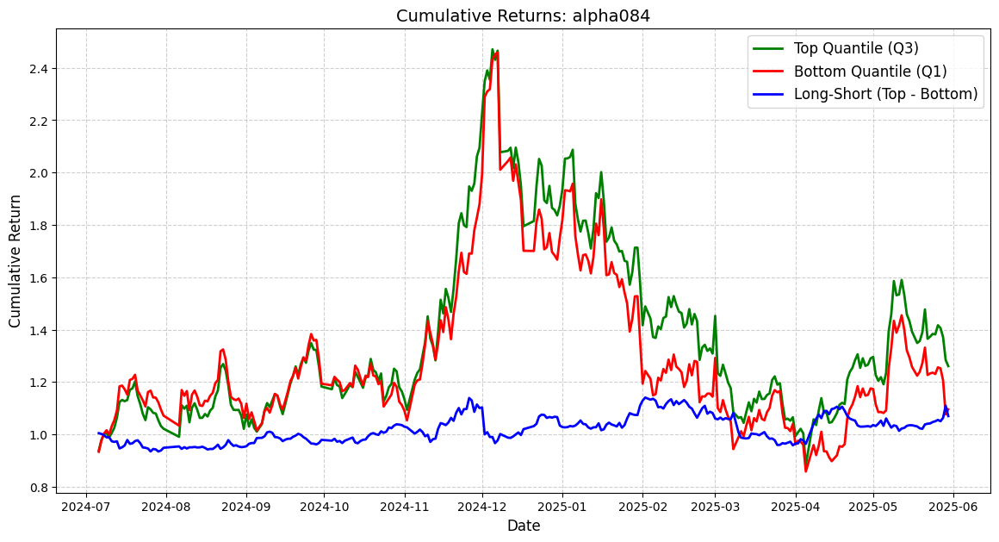

Dropped 16.0% entries from factor data: 13.0% in forward returns computation and 3.1% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


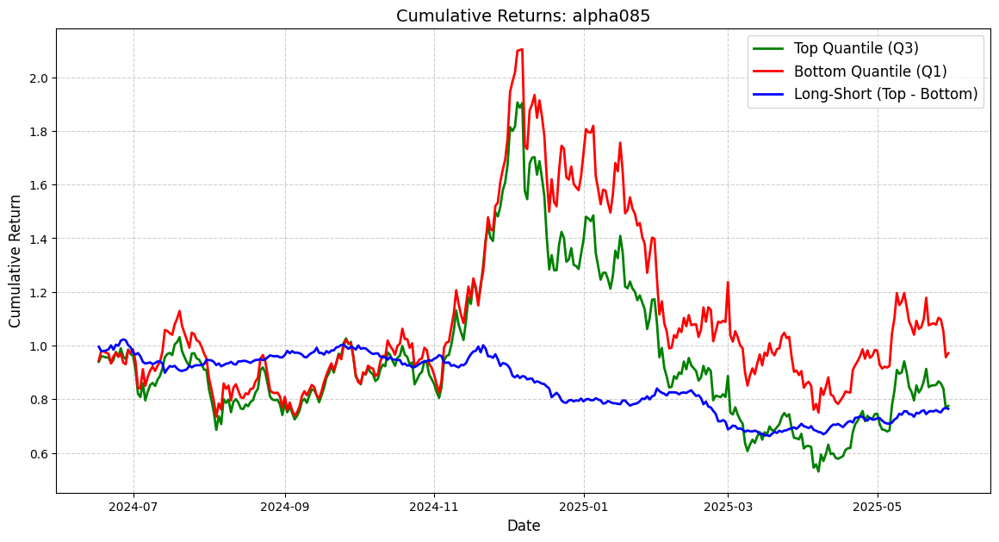

Dropped 100.0% entries from factor data: 13.0% in forward returns computation and 87.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
 alpha086 error continue
 alpha087 error continue
Dropped 0.6% entries from factor data: 0.3% in forward returns computation and 0.2% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


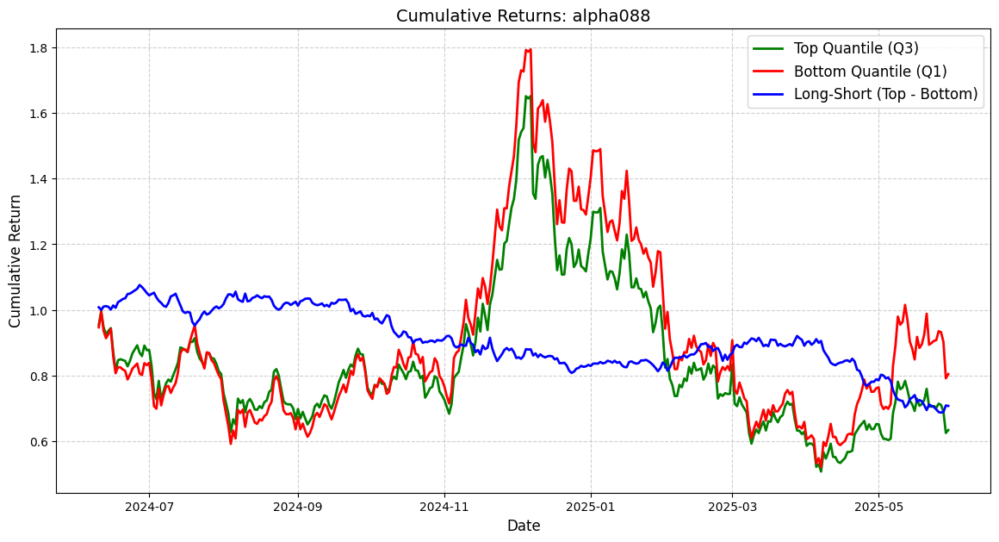

 alpha089 error continue
 alpha090 error continue
 alpha091 error continue
Dropped 94.5% entries from factor data: 11.9% in forward returns computation and 82.7% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
 alpha092 error continue
 alpha093 error continue
Dropped 13.2% entries from factor data: 0.3% in forward returns computation and 12.8% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


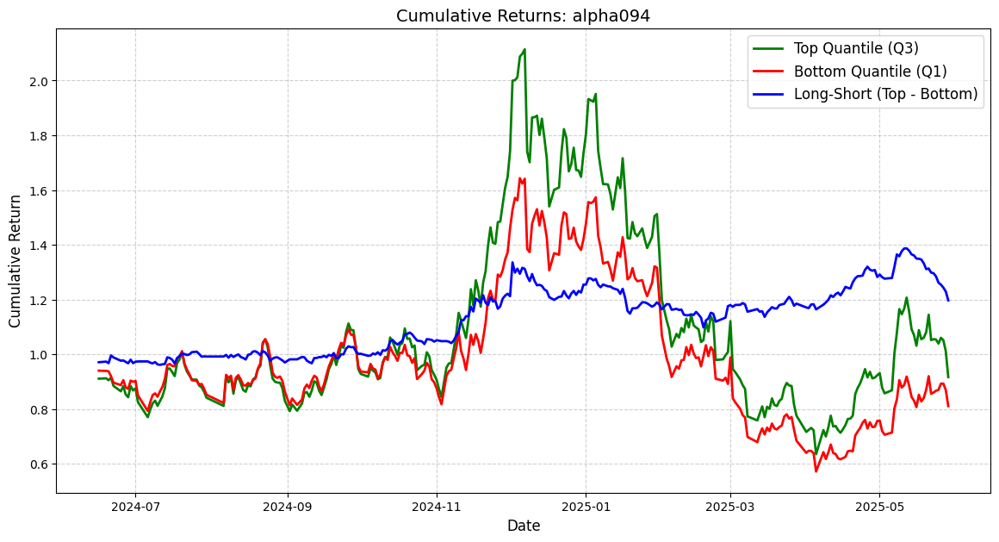

Dropped 100.0% entries from factor data: 13.0% in forward returns computation and 87.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
 alpha095 error continue
                           KAS/USDT:USDT  AVAX/USDT:USDT  QTUM/USDT:USDT  \
date                                                                       
2024-06-02 00:00:00+00:00       0.000000        0.000000        0.000000   
2024-06-03 00:00:00+00:00       0.000000        0.000000        0.000000   
2024-06-04 00:00:00+00:00       0.000000        0.000000        0.000000   
2024-06-05 00:00:00+00:00       0.990870        0.000000        0.000000   
2024-06-06 00:00:00+00:00       0.000000        0.000000        0.000000   
...                                  ...             ...             ...   
2025-05-27 00:00:00+00:00       0.000000        0.000000        0.174078   
2025-05-28 00:00:00+00:00       0.000000        0.000000        0.962250   
2025-05-29 00:00:00+00:00       0.107211       -0.8

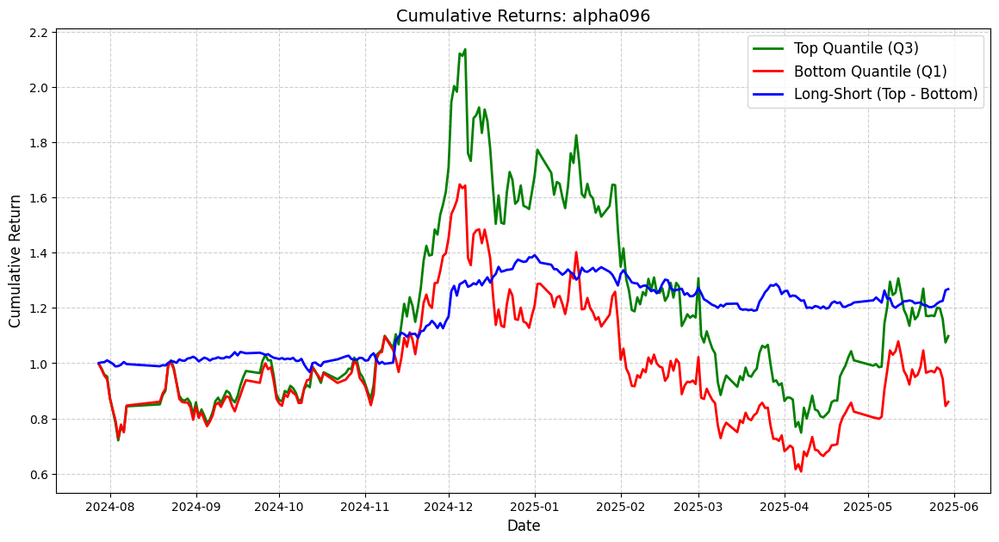

 alpha097 error continue
Dropped 14.9% entries from factor data: 12.2% in forward returns computation and 2.7% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


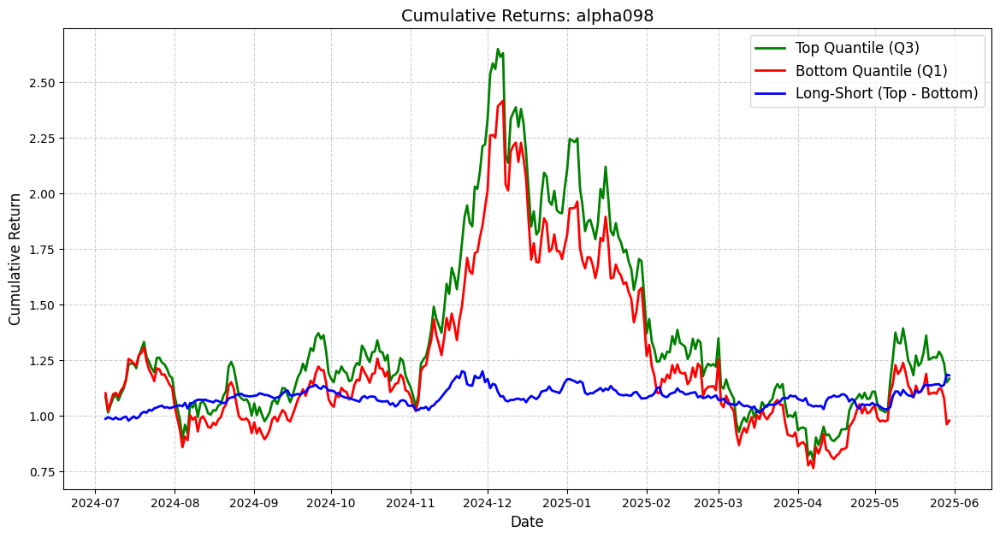

Dropped 100.0% entries from factor data: 13.0% in forward returns computation and 87.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
 alpha099 error continue
 alpha100 error continue
Dropped 0.3% entries from factor data: 0.3% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


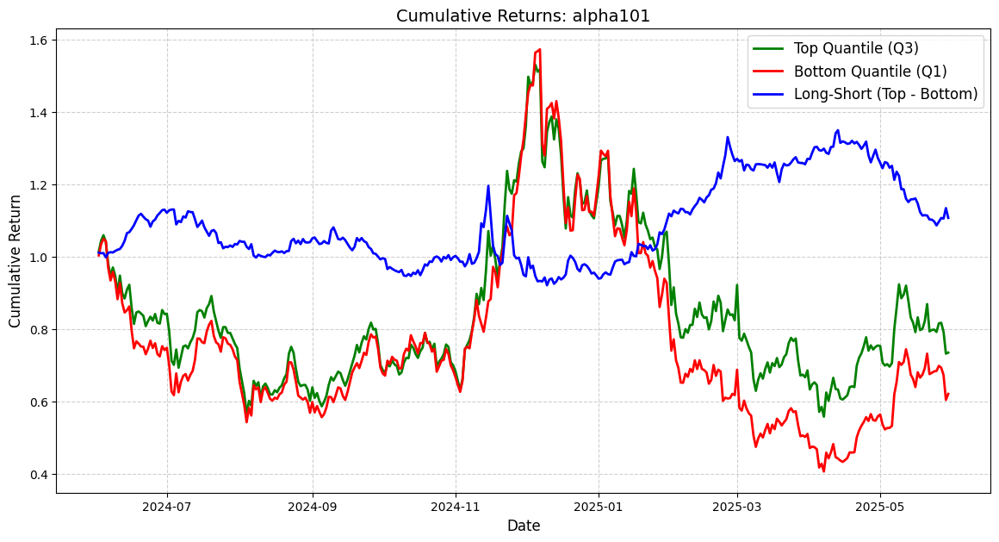

In [14]:
import alphalens
alpha_list = [f"alpha{num:03d}" for num in range(1, 102)]
curr_alpha_list = alpha_list[0:101]
n_factors = len(curr_alpha_list)
fig, axes = plt.subplots(n_factors, 1, figsize=(14, 7 * n_factors))
for alpha in curr_alpha_list:
    try:
       single_alpha_back_test(alpha)
    except:
        print(f' {alpha} error continue')